In [1]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import cell2location
import squidpy as sq

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import f_oneway
from scipy.stats import pearsonr
from statsmodels.stats.multitest import multipletests
import numpy as np
from scipy.spatial import distance
from scipy.spatial.distance import cdist

/home/jaehyunchoi/.conda/envs/spatial/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/jaehyunchoi/.conda/envs/spatial/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/jaehyunchoi/.conda/envs/spatial/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/home/jaehyunchoi/.conda/envs/spatial/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/home/jaehyunchoi/.conda/envs/spatial/lib/python3.10/site-packages/anndata/utils.py:429: Futur

# import slide data

In [2]:
adata_280A1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_280A1_c2l.h5ad")
adata_280B1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_280B1_c2l.h5ad")
adata_280C1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_280C1_c2l.h5ad")
adata_280D1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_280D1_c2l.h5ad")
adata_015A1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_015A1_c2l.h5ad")
adata_015B1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_015B1_c2l.h5ad")
adata_015C1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_015C1_c2l.h5ad")
adata_015D1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_015D1_c2l.h5ad")
adata_019A1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_019A1_c2l.h5ad")
adata_281B1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_281B1_c2l.h5ad")
adata_281C1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_281C1_c2l.h5ad")
adata_281D1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_281D1_c2l.h5ad")
adata_092A1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_092A1_c2l.h5ad")
adata_092B1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_092B1_c2l.h5ad")
adata_092C1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_092C1_c2l.h5ad")
adata_092D1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_092D1_c2l.h5ad")
adata_281A1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_281A1_c2l.h5ad")
adata_282A1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_282A1_c2l.h5ad")
adata_051B1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_051B1_c2l.h5ad")
adata_051C1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_051C1_c2l.h5ad")
adata_051D1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_051D1_c2l.h5ad")
adata_282B1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_282B1_c2l.h5ad")
adata_279B1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_279B1_c2l.h5ad")
adata_279C1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_279C1_c2l.h5ad")
adata_279D1=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/data/adata_279D1_c2l.h5ad")

In [3]:
import json

# path to scalefactor JSON
with open("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/V10T03-280-C1/spatial/scalefactors_json.json", "r") as f:
    scale_dict = json.load(f)

# scaling factor: pixels to microns
scalef = scale_dict["tissue_hires_scalef"] 

histological_palette = {
    "Blood Vessel": "#e7acc6",
    "Diseased": "#ebc96b",
    "Large Airway": "#41639e",
    "Inflammation": "#a15756",
    "Normal Alveolar and Other": "#6fb1cb",
    "Suspect Fibrosis": "#8a70a5"
}

# Adata merged analysis

In [13]:
path = "/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/analysis/Radial_distance/data"

In [14]:
adata_281D1 = sc.read(f"{path}/281D1/adata_281D1_c2l.h5ad")
with open(f"{path}/281D1/scalefactors_json.json", "r") as f:
    scale_dict_281D1 = json.load(f)
spotf_281D1 = scale_dict_281D1['spot_diameter_fullres']
scalef_281D1 = 55/spotf_281D1
scalef_281D1

0.5848705681432699

In [15]:
import scanpy as sc
import json
import os

path = "/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/analysis/Radial_distance/data"
samples = ["092A1","092B1","092C1","092D1","015A1", "015B1","015C1", "015D1","019A1","051B1","051C1",
           "051D1","279B1","279C1","279D1","280A1","280B1","280C1","280D1", "281A1","281B1","281C1", "281D1","282A1","282B1"]  # 폴더 이름들

# 결과 저장 딕셔너리
adata_dict = {}
scalef_dict = {}

for sample in samples:
    # h5ad 불러오기
    adata_path = os.path.join(path, sample, f"adata_{sample}_c2l.h5ad")
    adata = sc.read(adata_path)
    
    # scalefactor 계산
    json_path = os.path.join(path, sample, "scalefactors_json.json")
    with open(json_path, "r") as f:
        scale_dict = json.load(f)
    spotf = scale_dict['spot_diameter_fullres']
    scalef = 55 / spotf
    
    # 딕셔너리에 저장
    adata_dict[sample] = adata
    scalef_dict[sample] = scalef
adata_dict

{'092A1': AnnData object with n_obs × n_vars = 4199 × 13949
     obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'ATI', 'ATII', 'Aberrant_Basaloid', 'B', 'B_Plasma', 'Basal', 'Ciliated', 'Club', 'DC_Langerhans', 'DC_Mature', 'Fibroblast', 'Goblet', 'ILC_A', 'ILC_B', 'Ionocyte', 'Lymphatic', 'Macrophage', 'Macrophage_Alveolar', 'Mast', 'Mesothelial', 'Myofibroblast', 'NK', 'PNEC', 'Pericyte', 'SMC', 'T_CD4', 'T_Cytotoxic', 'T_PD1high', 'T_Regulatory', 'VE_Arterial', 'VE_Capillary_A', 'VE_Capillary_B', 'VE_Peribronchial', 'VE_Venous', 'cDC1', 'cDC2', 'cMonocyte', 'ncMonocyte', 'pDC', 'annotation'
     uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
     obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf',
 '092B1': AnnData object with n_obs × n_vars = 4121 × 13949
     obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_

In [16]:
samples = ["092A1","092B1","092C1","092D1","015A1", "015B1","015C1", "015D1","019A1","051B1","051C1",
           "051D1","279B1","279C1","279D1","280A1","280B1","280C1","280D1", "281A1","281B1","281C1", "281D1","282A1","282B1"]
for sample in samples:
    locals()[f"adata_{sample}"] = adata_dict[sample]
    locals()[f"scalef_{sample}"] = scalef_dict[sample]

# Distance analysis

In [27]:
adata_281D1.uns['spatial']

{'V10T03-281-D1': {'images': {'hires': array([[[1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.],
           ...,
           [1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.]],
   
          [[1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.],
           ...,
           [1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.]],
   
          [[1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.],
           ...,
           [1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.]],
   
          ...,
   
          [[1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.],
           ...,
           [1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.]],
   
          [[1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.],
           ...,
           [1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.]],
   
          [[1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.],
           ...,

In [22]:
coords = adata_281D1.obsm["spatial"]
print(coords)

[[8803 7468]
 [4505 1575]
 [8201 2940]
 ...
 [3601 8754]
 [3374 6867]
 [5086 2075]]


In [6]:
# path to scalefactor JSON
with open("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/V10T03-281-D1/spatial/scalefactors_json.json", "r") as f:
    scale_dict = json.load(f)

# scaling factor: pixels to microns
scalef = scale_dict["tissue_hires_scalef"] 
scale_dict

{'spot_diameter_fullres': 94.03790000000001,
 'tissue_hires_scalef': 0.16666667,
 'fiducial_diameter_fullres': 151.90738,
 'tissue_lowres_scalef': 0.05}

# adata_281D1 analysis (distance from FF)

In [65]:
# 1. radial distance map

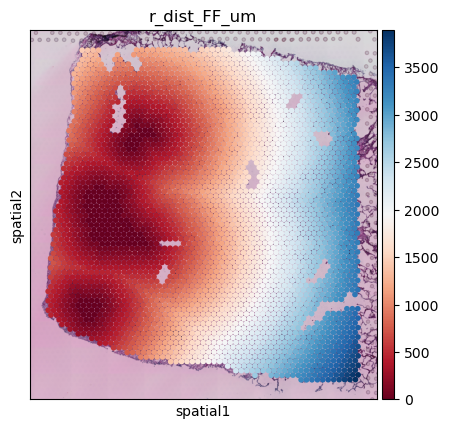

In [174]:
# path to scalefactor JSON
with open("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/V10T03-281-D1/spatial/scalefactors_json.json", "r") as f:
    scale_dict = json.load(f)

# scaling factor: pixels to microns
spotf = scale_dict['spot_diameter_fullres']
scalef = 55/spotf

# adata.obsm["spatial"]에는 각 spot의 (x, y) 좌표가 들어있음
coords = adata_281D1.obsm["spatial"]

# Fibrotic foci(suspect fibrosis)에 속한 spot 선택
mask_FF = adata_281D1.obs["annotation"] == "Suspect Fibrosis"
coords_FF = coords[mask_FF]

# 각 spot에서 FF 영역까지의 최소 유클리드 거리 계산
from scipy.spatial.distance import cdist

# 모든 spot → FF spot들 간 거리행렬
dist_matrix = cdist(coords, coords_FF, metric="euclidean")

# 각 spot에 대해 FF까지의 최소 거리 선택
min_dist = dist_matrix.min(axis=1)

# adata.obs에 저장
adata_281D1.obs["r_dist_FF"] = min_dist
adata_281D1.obs["r_dist_FF_um"] = adata_281D1.obs["r_dist_FF"] * scalef

sc.pl.spatial(
    adata_281D1,
    color=["r_dist_FF_um"],
    img_key='hires',
    spot_size=30,
    size=5,
    cmap = "RdBu"
)

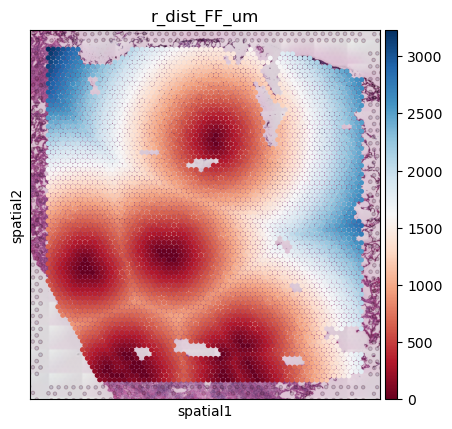

In [12]:
# path to scalefactor JSON
with open("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/V19S23-092-C1/spatial/scalefactors_json.json", "r") as f:
    scale_dict = json.load(f)

# scaling factor: pixels to microns
spotf = scale_dict['spot_diameter_fullres']
scalef = 55/spotf

# adata.obsm["spatial"]에는 각 spot의 (x, y) 좌표가 들어있음
coords = adata_092C1.obsm["spatial"]

# Fibrotic foci(suspect fibrosis)에 속한 spot 선택
mask_FF = adata_092C1.obs["annotation"] == "Suspect Fibrosis"
coords_FF = coords[mask_FF]

# 각 spot에서 FF 영역까지의 최소 유클리드 거리 계산
from scipy.spatial.distance import cdist

# 모든 spot → FF spot들 간 거리행렬
dist_matrix = cdist(coords, coords_FF, metric="euclidean")

# 각 spot에 대해 FF까지의 최소 거리 선택
min_dist = dist_matrix.min(axis=1)

# adata.obs에 저장
adata_092C1.obs["r_dist_FF"] = min_dist
adata_092C1.obs["r_dist_FF_um"] = adata_092C1.obs["r_dist_FF"] * scalef
sc.settings.figdir = "/home/jaehyunchoi/bystander_collaboration/Figure_script_IPF/Figures/spatial/"
sc.pl.spatial(
    adata_092C1,
    color=["r_dist_FF_um"],
    img_key='hires',
    spot_size=30,
    size=5,
    cmap = "RdBu",
    save = "spatial_distance_example_092C1.pdf"
)

In [179]:
adata_281D1

AnnData object with n_obs × n_vars = 3491 × 13949
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'ATI', 'ATII', 'Aberrant_Basaloid', 'B', 'B_Plasma', 'Basal', 'Ciliated', 'Club', 'DC_Langerhans', 'DC_Mature', 'Fibroblast', 'Goblet', 'ILC_A', 'ILC_B', 'Ionocyte', 'Lymphatic', 'Macrophage', 'Macrophage_Alveolar', 'Mast', 'Mesothelial', 'Myofibroblast', 'NK', 'PNEC', 'Pericyte', 'SMC', 'T_CD4', 'T_Cytotoxic', 'T_PD1high', 'T_Regulatory', 'VE_Arterial', 'VE_Capillary_A', 'VE_Capillary_B', 'VE_Peribronchial', 'VE_Venous', 'cDC1', 'cDC2', 'cMonocyte', 'ncMonocyte', 'pDC', 'annotation', 'r_dist_FF', 'r_dist_FF_um'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [66]:
# 2. gene_cor dataframe analysis

In [175]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import minmax_scale

In [176]:
adata_281D1_sub = adata_281D1[adata_281D1.obs["r_dist_FF_um"] < 500].copy()

In [177]:
sc.pp.normalize_total(adata_281D1_sub, target_sum=1e4)
sc.pp.log1p(adata_281D1_sub)

sc.pp.highly_variable_genes(adata_281D1_sub, n_top_genes=1000, flavor="seurat_v3")

sel_genes = adata_281D1_sub.var[adata_281D1_sub.var["highly_variable"]].index

/home/jaehyunchoi/.conda/envs/spatial/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


In [180]:
# gene expression

In [178]:
import pandas as pd
from scipy.stats import pearsonr

results = []
for g in sel_genes:
    y = adata_281D1_sub[:, g].X.toarray().flatten()
    x = adata_281D1_sub.obs["r_dist_FF_um"].values
    if np.var(y) > 0:
        r, p = pearsonr(x, y)
        results.append([g, r, p])

df_cor = pd.DataFrame(results, columns=["gene", "cor", "pval"])
# FDR 보정
from statsmodels.stats.multitest import multipletests
df_cor["padj"] = multipletests(df_cor["pval"], method="fdr_bh")[1]

In [49]:
df_cor.sort_values("padj", ascending=True)

,gene,cor,pval,padj
763,RPS3A,0.135050,0.000131,0.065607
348,GPX3,0.139133,0.000081,0.065607
675,PPIA,0.121934,0.000561,0.186986
965,ZC4H2,-0.112351,0.001489,0.372171
799,SERPINA1,0.109321,0.001997,0.399406
...,...,...,...,...
492,LINC01135,0.000444,0.990022,0.996998
32,ALG14,0.000354,0.992030,0.996998
275,EOGT,0.000194,0.995640,0.997636
155,CENPO,-0.000138,0.996895,0.997893


In [50]:
genes_pos = (
    df_cor.sort_values("cor", ascending=False)
          .head(n_genes)["gene"]
          .tolist()
)
genes_pos

['GPX3',
 'RPS3A',
 'PPIA',
 'SERPINA1',
 'TNFAIP8L1',
 'SFTPC',
 'RPL5',
 'CXCL1',
 'C1QB',
 'GAPDH',
 'NAPSA',
 'SLC34A2',
 'GPLD1',
 'SLPI',
 'PTPN3',
 'RPL6',
 'MT-ND5',
 'HSP90AA1',
 'IGHG2',
 'RPS13']

In [36]:
dist_cutoff_plot = 500
n_genes = 30
adata_281D1_sub = adata_281D1[adata_281D1.obs["r_dist_FF_um"] < dist_cutoff_plot].copy()

In [37]:
# long-format으로 변환: (spot, gene, expression, distance)
expr_df = pd.DataFrame(
    adata_281D1_sub[:, genes_pos].X.toarray(),
    index=adata_281D1_sub.obs_names,
    columns=genes_pos
).reset_index().melt(
    id_vars="index", value_vars=genes_pos,
    var_name="gene", value_name="expression"
)

expr_df["r_dist"] = adata_281D1_sub.obs.loc[expr_df["index"], "r_dist_FF_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)


In [38]:
avg_expr = (
    expr_df.groupby(["gene", "r_dist"])["expression"]
           .mean()
           .reset_index()
)

# 유전자별로 0–1 scaling
avg_expr["avg_expr_scaled"] = avg_expr.groupby("gene")["expression"].transform(
    lambda x: minmax_scale(x, feature_range=(0,1))
)

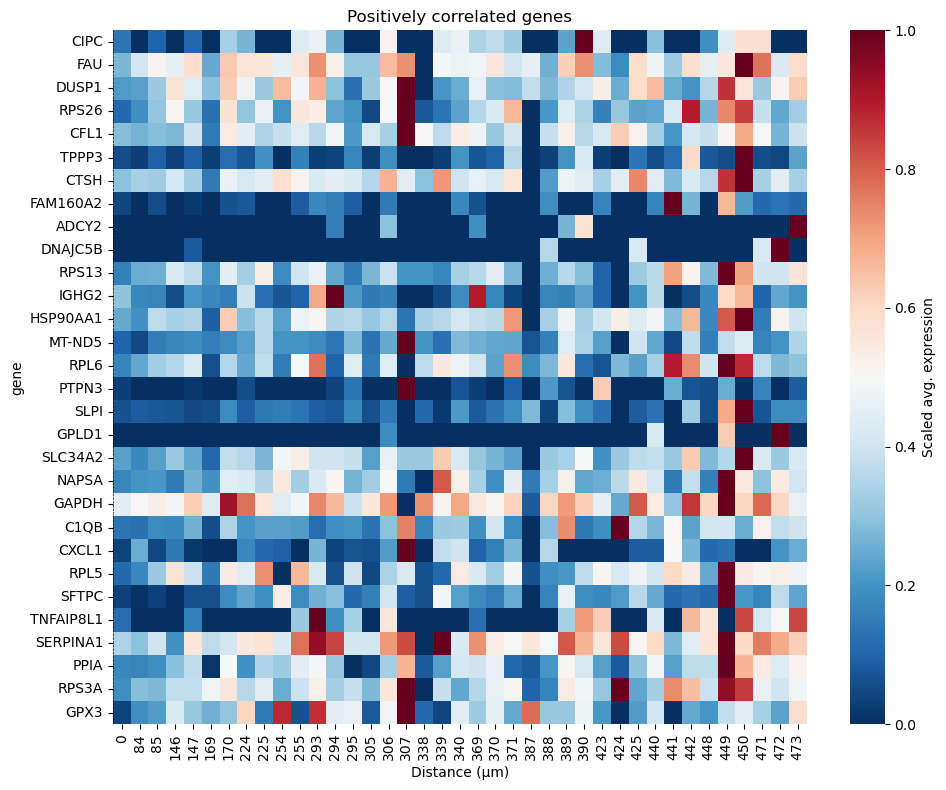

In [39]:
heatmap_data = avg_expr.pivot(index="gene", columns="r_dist", values="avg_expr_scaled")

# 유전자 순서를 correlation 높은 순서로 맞춤
heatmap_data = heatmap_data.reindex(index=genes_pos[::-1])

plt.figure(figsize=(10,8))
sns.heatmap(
    heatmap_data,
    cmap="RdBu_r",  # col_scale_lajolla 비슷한 팔레트
    cbar_kws={"label": "Scaled avg. expression"}
)
plt.axvline(x=np.where(heatmap_data.columns==0)[0][0], color="black", ls="--", lw=0.5)  # distance=0 선
plt.xlabel("Distance (µm)")
plt.title("Positively correlated genes")
plt.tight_layout()
plt.show()

In [40]:
top_gene = df_cor.sort_values("cor", ascending=False).iloc[3]["gene"]
top_gene

'SERPINA1'

<Axes: xlabel='r_dist_FF_um'>

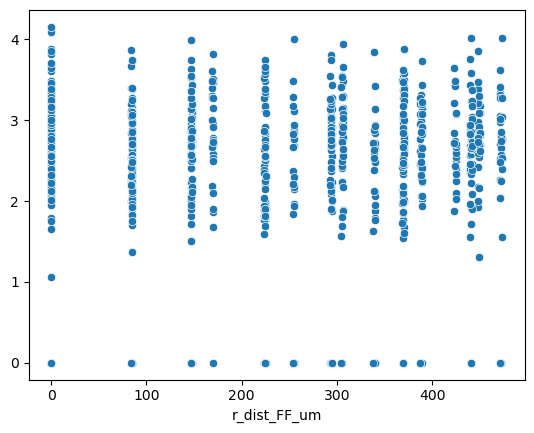

In [23]:
import seaborn as sns
sns.scatterplot(x=adata_281D1_sub.obs["r_dist_FF_um"], 
                y=adata_281D1_sub[:, 'RPS3A'].X.toarray().flatten())

<Axes: xlabel='r_dist_FF_um'>

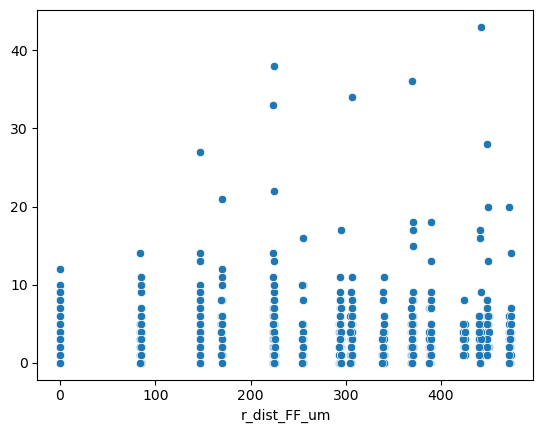

In [44]:
import seaborn as sns
sns.scatterplot(x=adata_281D1_sub.obs["r_dist_FF_um"], 
                y=adata_281D1_sub[:, 'RPS3A'].X.toarray().flatten())

In [51]:
genes_pos = (
    df_cor.sort_values("cor", ascending=False)
          .query("pval < 0.01")              # sign_001 == TRUE 에 해당
          .head(n_genes)["gene"].tolist()
)
genes_pos

['GPX3',
 'RPS3A',
 'PPIA',
 'SERPINA1',
 'TNFAIP8L1',
 'SFTPC',
 'RPL5',
 'CXCL1',
 'C1QB',
 'GAPDH',
 'MAGIX',
 'JCHAIN',
 'THAP1',
 'LUM',
 'CCDC80',
 'DES',
 'ZNF66',
 'ZC4H2']

In [ ]:
genes_pos = (
    df_cor.sort_values("cor", ascending=False)
          .query("pval < 0.01")              # sign_001 == TRUE 에 해당
          .head(n_genes)["gene"].tolist()
)
genes_pos

expr_df = pd.DataFrame(
    adata_281D1_sub[:, genes_pos].X.toarray(),
    index=adata_281D1_sub.obs_names,
    columns=genes_pos
).reset_index().melt(
    id_vars="index", value_vars=genes_pos,
    var_name="gene", value_name="expression"
)

expr_df["r_dist"] = adata_281D1_sub.obs.loc[expr_df["index"], "r_dist_FF_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)


In [64]:
expr_df

,index,gene,expression,r_dist
0,AAACCGGGTAGGTACC-1-281D1,GPX3,2.130093,170
1,AAACCGTTCGTCCAGG-1-281D1,GPX3,1.402794,448
2,AAACCTCATGAAGTTG-1-281D1,GPX3,1.136967,388
3,AAAGACCCAAGTCGCG-1-281D1,GPX3,2.204367,450
4,AAAGGGCAGCTTGAAT-1-281D1,GPX3,1.520663,425
...,...,...,...,...
14341,TTGTGGCCCTGACAGT-1-281D1,ZC4H2,0.000000,339
14342,TTGTGGTAGGAGGGAT-1-281D1,ZC4H2,0.000000,225
14343,TTGTTAGCAAATTCGA-1-281D1,ZC4H2,0.000000,85
14344,TTGTTTCATTAGTCTA-1-281D1,ZC4H2,0.000000,225


In [60]:
from statsmodels.nonparametric.smoothers_lowess import lowess
def smooth_curve(x, y, frac=0.3):
    """LOESS smoothing"""
    smoothed = lowess(y, x, frac=frac, return_sorted=True)
    return smoothed[:,0], smoothed[:,1]


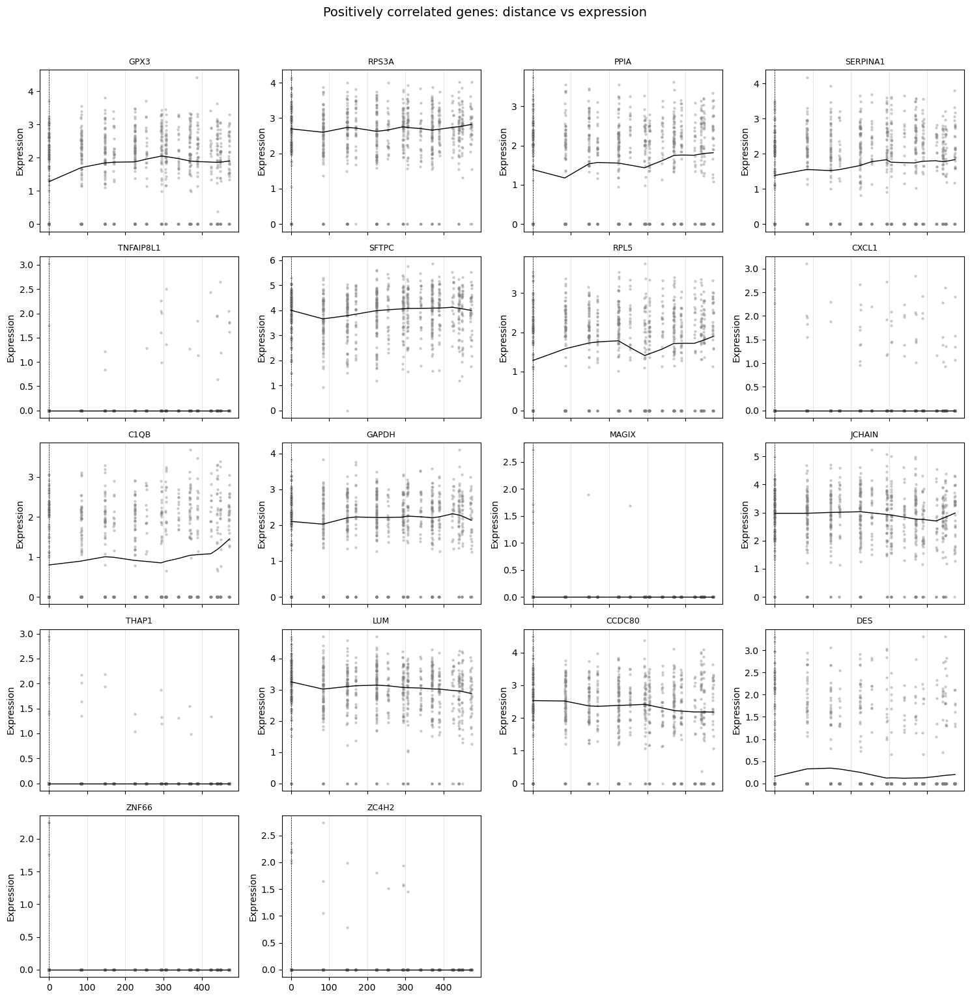

In [61]:
ncols = 4
nrows = int(np.ceil(len(genes_pos)/ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 3*nrows), sharex=True)
axes = axes.flatten()

for i, gene in enumerate(genes_pos):
    df_g = expr_df.query("gene == @gene")
    x_smooth, y_smooth = smooth_curve(df_g["r_dist"], df_g["expression"], frac=0.3)
    axes[i].scatter(df_g["r_dist"], df_g["expression"], s=5, alpha=0.3, color="grey")
    axes[i].plot(x_smooth, y_smooth, color="black", lw=1)
    axes[i].axvline(0, ls="--", color="black", lw=0.5)
    axes[i].set_title(gene, fontsize=9)
    axes[i].set_ylabel("Expression")
    axes[i].grid(axis="x", color="grey", alpha=0.3, lw=0.5)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle("Positively correlated genes: distance vs expression", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

/tmp/ipykernel_1236025/2809484819.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=pos_cor, y="gene", x="cor", palette="RdBu")


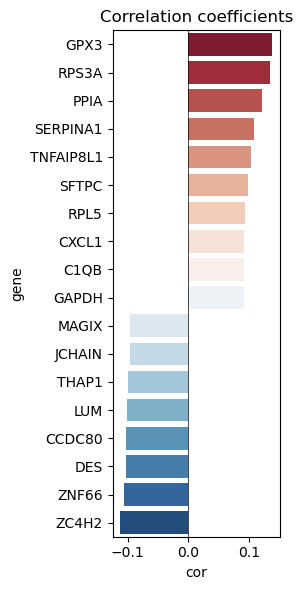

In [63]:
pos_cor = df_cor[df_cor["gene"].isin(genes_pos)].sort_values("cor", ascending=False)

plt.figure(figsize=(3,6))
sns.barplot(data=pos_cor, y="gene", x="cor", palette="RdBu")
plt.axvline(0, color="black", lw=0.5)
plt.title("Correlation coefficients")
plt.tight_layout()
plt.show()

In [181]:
# cluster abundance

In [185]:
adata_281D1

AnnData object with n_obs × n_vars = 3491 × 13949
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'ATI', 'ATII', 'Aberrant_Basaloid', 'B', 'B_Plasma', 'Basal', 'Ciliated', 'Club', 'DC_Langerhans', 'DC_Mature', 'Fibroblast', 'Goblet', 'ILC_A', 'ILC_B', 'Ionocyte', 'Lymphatic', 'Macrophage', 'Macrophage_Alveolar', 'Mast', 'Mesothelial', 'Myofibroblast', 'NK', 'PNEC', 'Pericyte', 'SMC', 'T_CD4', 'T_Cytotoxic', 'T_PD1high', 'T_Regulatory', 'VE_Arterial', 'VE_Capillary_A', 'VE_Capillary_B', 'VE_Peribronchial', 'VE_Venous', 'cDC1', 'cDC2', 'cMonocyte', 'ncMonocyte', 'pDC', 'annotation', 'r_dist_FF', 'r_dist_FF_um'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [187]:
features = ["Myofibroblast","Fibroblast","cDC1", "cDC2","T_CD4"]
results = []

x = adata_281D1.obs["r_dist_FF_um"].values

for f in features:
    y = adata_281D1.obs[f].values
    if np.var(y) > 0:
        r, p = pearsonr(x, y)
        results.append([f, r, p])

df_cell_cor = pd.DataFrame(results, columns=["feature", "cor", "pval"])

# 다중검정 보정
from statsmodels.stats.multitest import multipletests
df_cell_cor["padj"] = multipletests(df_cell_cor["pval"], method="fdr_bh")[1]

print(df_cell_cor)

         feature       cor          pval          padj
0  Myofibroblast  0.225147  2.307216e-41  5.768040e-41
1     Fibroblast -0.087568  2.194913e-07  2.194913e-07
2           cDC1  0.105073  4.870193e-10  6.087741e-10
3           cDC2  0.286998  3.521455e-67  1.760727e-66
4          T_CD4  0.110434  6.043183e-11  1.007197e-10


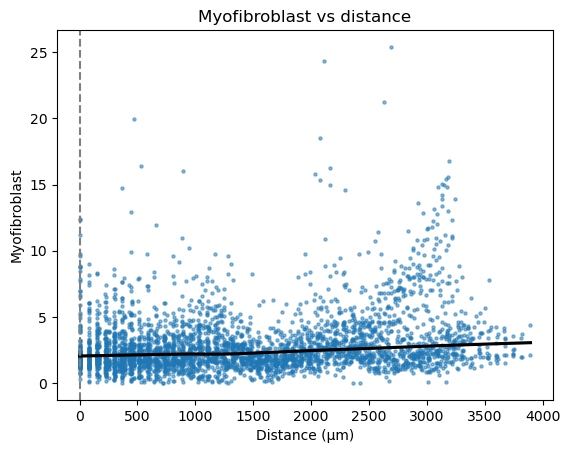

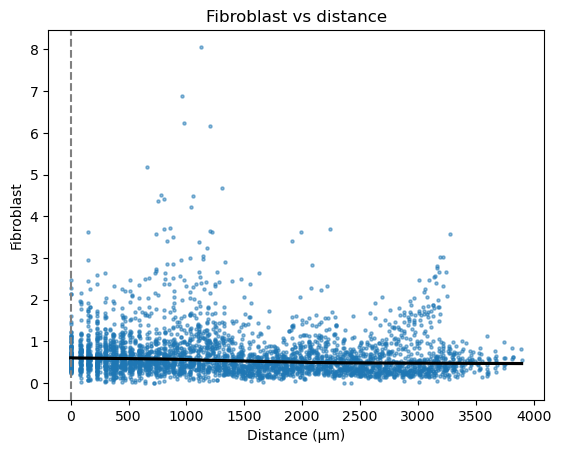

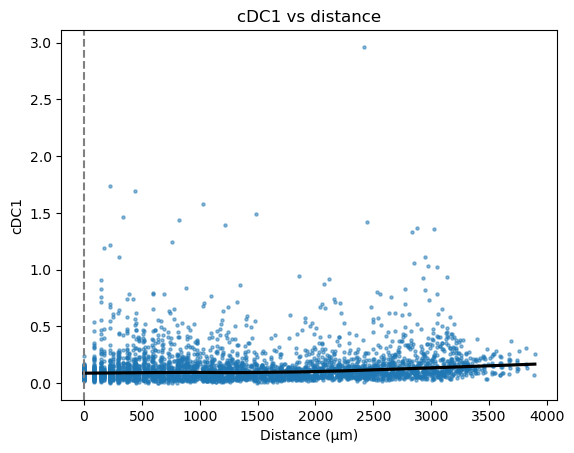

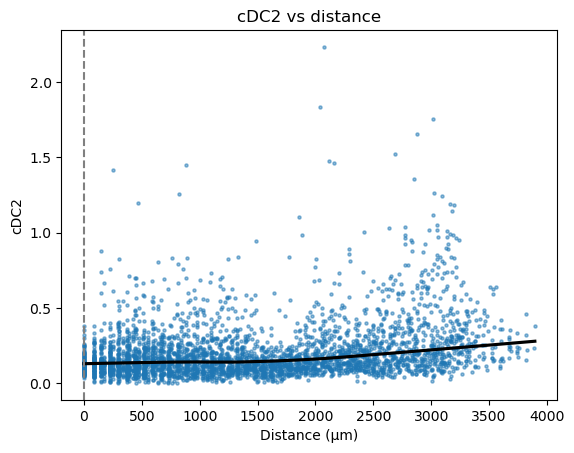

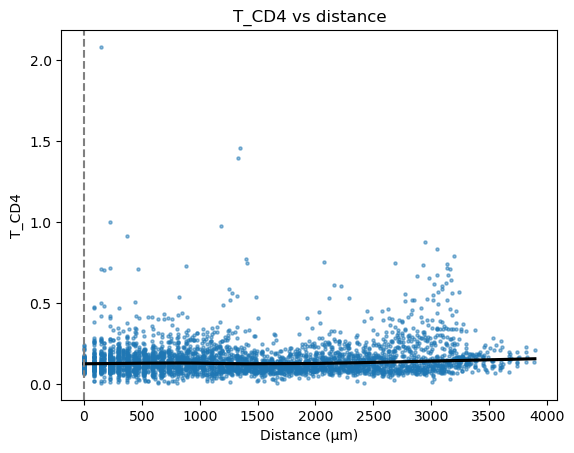

In [188]:
import seaborn as sns
import matplotlib.pyplot as plt

for f in features:
    sns.regplot(
        x="r_dist_FF_um", y=f, data=adata_281D1.obs,
        scatter_kws={"s":5, "alpha":0.5}, lowess=True, line_kws={"color":"black"}
    )
    plt.axvline(0, ls="--", color="grey")
    plt.title(f"{f} vs distance")
    plt.xlabel("Distance (µm)")
    plt.ylabel(f)
    plt.show()

# Radial distance _ graph ( Histology = Suspect fibrosis)

In [159]:
adata = adata_281D1
scalef = scalef_281D1
Histology = "Suspect Fibrosis"
dist_cutoff = 500

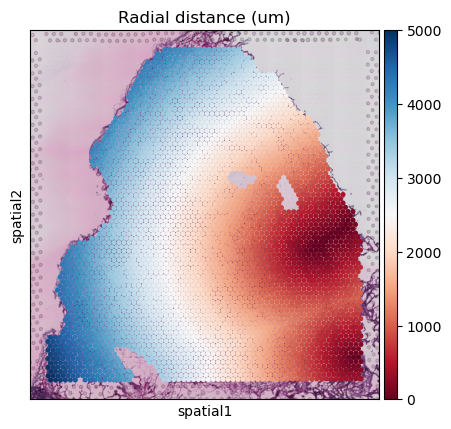

In [8]:
adata = adata_281C1
scalef = scalef_281C1
Histology = "Suspect Fibrosis"
dist_cutoff = 500
coords = adata.obsm["spatial"]
mask_FF = adata.obs["annotation"] == Histology
coords_FF = coords[mask_FF]
dist_matrix = cdist(coords, coords_FF, metric="euclidean")
min_dist = dist_matrix.min(axis=1)
adata.obs["r_dist_FF"] = min_dist
adata.obs["r_dist_FF_um"] = adata.obs["r_dist_FF"] * scalef
sc.pl.spatial(
    adata,
    color=["r_dist_FF_um"],
    img_key='hires',
    spot_size=30,
    size=5,
    title = "Radial distance (um)",
    cmap = "RdBu"
)

In [10]:
# 저장 폴더 지정
sc.settings.figdir = "/home/jaehyunchoi/bystander_collaboration/Figure_script_IPF/Figures/"

sc.pl.spatial(
    adata,
    color=["r_dist_FF_um"],
    img_key='hires',
    spot_size=30,
    size=5,
    title = "Radial distance (um)",
    cmap = "RdBu",
    show=False,
    save="Fig2_distance_281C1.pdf"
)

[<Axes: title={'center': 'Radial distance (um)'}, xlabel='spatial1', ylabel='spatial2'>]

In [18]:
adata.obs["highlight_mask"].value_counts()

highlight_mask
0    3773
Name: count, dtype: int64

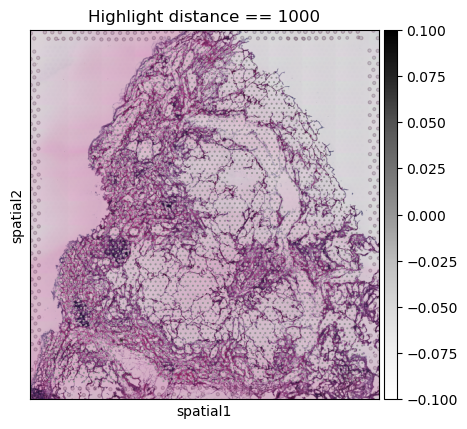

In [17]:
adata.obs["highlight_mask"] = mask.astype(int)  # 또는 0/1, 혹은 'yes'/'no'
from matplotlib.colors import ListedColormap

#black_white_cmap = ListedColormap(["white", "black"])

sc.pl.spatial(
    adata,
    color="highlight_mask",
    cmap="Greys",  # ✔️ 미리 정의된 컬러맵 이름
    spot_size=30,
    img_key='hires',
    size=2,
    title="Highlight distance == 1000"
)

In [245]:
adata

AnnData object with n_obs × n_vars = 3491 × 13949
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'ATI', 'ATII', 'Aberrant_Basaloid', 'B', 'B_Plasma', 'Basal', 'Ciliated', 'Club', 'DC_Langerhans', 'DC_Mature', 'Fibroblast', 'Goblet', 'ILC_A', 'ILC_B', 'Ionocyte', 'Lymphatic', 'Macrophage', 'Macrophage_Alveolar', 'Mast', 'Mesothelial', 'Myofibroblast', 'NK', 'PNEC', 'Pericyte', 'SMC', 'T_CD4', 'T_Cytotoxic', 'T_PD1high', 'T_Regulatory', 'VE_Arterial', 'VE_Capillary_A', 'VE_Capillary_B', 'VE_Peribronchial', 'VE_Venous', 'cDC1', 'cDC2', 'cMonocyte', 'ncMonocyte', 'pDC', 'annotation', 'r_dist_FF', 'r_dist_FF_um'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [161]:
coords = adata.obsm["spatial"]
mask_FF = adata.obs["annotation"] == Histology
coords_FF = coords[mask_FF]
dist_matrix = cdist(coords, coords_FF, metric="euclidean")
min_dist = dist_matrix.min(axis=1)
adata.obs["r_dist_FF"] = min_dist
adata.obs["r_dist_FF_um"] = adata.obs["r_dist_FF"] * scalef

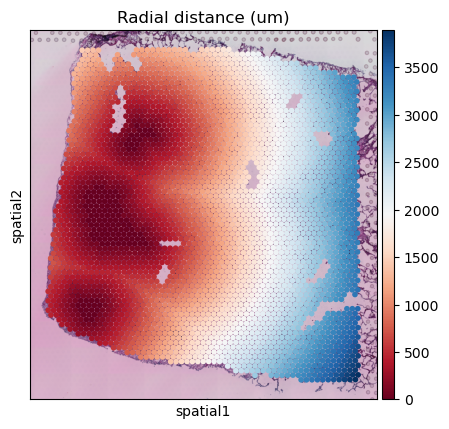

In [162]:
sc.pl.spatial(
    adata,
    color=["r_dist_FF_um"],
    img_key='hires',
    spot_size=30,
    size=5,
    title = "Radial distance (um)",
    cmap = "RdBu"
)

In [91]:
adata_sub = adata[adata.obs["r_dist_FF_um"] < dist_cutoff].copy()

sc.pp.normalize_total(adata_sub, target_sum=1e4)
sc.pp.log1p(adata_sub)

sc.pp.highly_variable_genes(adata_sub, n_top_genes=1000, flavor="seurat_v3")

sel_genes = adata_sub.var[adata_sub.var["highly_variable"]].index

/home/jaehyunchoi/.conda/envs/spatial/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


In [93]:
results = []
for g in sel_genes:
    y = adata_sub[:, g].X.toarray().flatten()
    x = adata_sub.obs["r_dist_FF_um"].values
    if np.var(y) > 0:
        r, p = pearsonr(x, y)
        results.append([g, r, p])

df_cor = pd.DataFrame(results, columns=["gene", "cor", "pval"])
# FDR 보정
from statsmodels.stats.multitest import multipletests
df_cor["padj"] = multipletests(df_cor["pval"], method="fdr_bh")[1]
df_cor.sort_values("padj", ascending=True)

,gene,cor,pval,padj
604,MTRNR2L12,-0.273801,8.396427e-71,8.396427e-68
549,MALAT1,-0.246269,3.299556e-57,1.649778e-54
425,IGHG2,0.242933,1.136546e-55,3.788488e-53
763,RPS24,-0.236261,1.146054e-52,2.865136e-50
413,HYAL2,0.217958,6.704913e-45,1.340983e-42
...,...,...,...,...
893,TM4SF18,0.000140,9.929040e-01,9.968916e-01
404,HSD17B3,-0.000101,9.948787e-01,9.978723e-01
403,HSD17B2,0.000052,9.973755e-01,9.993743e-01
939,UNC5D,-0.000029,9.985068e-01,9.994966e-01


In [95]:
# Total adata analysis

In [334]:
from scipy.spatial.distance import cdist
import numpy as np
import scanpy as sc

samples = ["092B1","092C1","092D1","280B1","280C1","280D1","281B1","281C1", "281D1"]

processed_adatas = []

for sample in samples:
    adata = adata_dict[sample].copy()
    scalef = scalef_dict[sample]
    
    coords = adata.obsm["spatial"]
    
    # Histology 영역 필터링
    mask_FF = adata.obs["annotation"] == "Suspect Fibrosis"
    coords_FF = coords[mask_FF] 
    
    # 거리 계산
    dist_matrix = cdist(coords, coords_FF, metric="euclidean")
    min_dist = dist_matrix.min(axis=1)
    
    # 거리 저장
    adata.obs["r_dist_FF"] = min_dist
    adata.obs["r_dist_FF_um"] = min_dist * scalef
    
    # sample 이름 저장
    adata.obs["sample"] = sample
    
    processed_adatas.append(adata)

In [335]:
adata_merged = processed_adatas[0].concatenate(
    *processed_adatas[1:],
    batch_key="sample_batch",
    batch_categories=samples
)

/tmp/ipykernel_1236025/129854757.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_merged = processed_adatas[0].concatenate(


In [336]:
adata_merged

AnnData object with n_obs × n_vars = 36628 × 13949
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'ATI', 'ATII', 'Aberrant_Basaloid', 'B', 'B_Plasma', 'Basal', 'Ciliated', 'Club', 'DC_Langerhans', 'DC_Mature', 'Fibroblast', 'Goblet', 'ILC_A', 'ILC_B', 'Ionocyte', 'Lymphatic', 'Macrophage', 'Macrophage_Alveolar', 'Mast', 'Mesothelial', 'Myofibroblast', 'NK', 'PNEC', 'Pericyte', 'SMC', 'T_CD4', 'T_Cytotoxic', 'T_PD1high', 'T_Regulatory', 'VE_Arterial', 'VE_Capillary_A', 'VE_Capillary_B', 'VE_Peribronchial', 'VE_Venous', 'cDC1', 'cDC2', 'cMonocyte', 'ncMonocyte', 'pDC', 'annotation', 'r_dist_FF', 'r_dist_FF_um', 'sample_batch'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [337]:
adata_sub = adata_merged[adata_merged.obs["r_dist_FF_um"] < 500].copy()

sc.pp.normalize_total(adata_sub, target_sum=1e4)
sc.pp.log1p(adata_sub)

sc.pp.highly_variable_genes(adata_sub, n_top_genes=1000, flavor="seurat_v3")

sel_genes = adata_sub.var[adata_sub.var["highly_variable"]].index

/home/jaehyunchoi/.conda/envs/spatial/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


In [338]:
results = []
for g in sel_genes:
    y = adata_sub[:, g].X.toarray().flatten()
    x = adata_sub.obs["r_dist_FF_um"].values
    if np.var(y) > 0:
        r, p = pearsonr(x, y)
        results.append([g, r, p])

df_cor = pd.DataFrame(results, columns=["gene", "cor", "pval"])
# FDR 보정
from statsmodels.stats.multitest import multipletests
df_cor["padj"] = multipletests(df_cor["pval"], method="fdr_bh")[1]
df_cor.sort_values("padj", ascending=True)

,gene,cor,pval,padj
806,SCGB3A1,0.253086,3.812342e-169,3.812342e-166
342,HBB,-0.232655,1.614240e-142,8.071201e-140
393,IGHA1,0.229009,4.987754e-138,1.662585e-135
341,HBA2,-0.217779,1.081236e-124,2.703090e-122
718,PGC,-0.217496,2.287908e-124,4.575816e-122
...,...,...,...,...
915,TMEM132D,-0.000137,9.882268e-01,9.921956e-01
496,KCNIP4,0.000092,9.921201e-01,9.925188e-01
698,PADI4,0.000109,9.906381e-01,9.925188e-01
519,KLHL4,0.000105,9.909894e-01,9.925188e-01


In [339]:
df_cor[df_cor["gene"].isin(["PDCD1", "AREG", "IL1RL1","LGALS1"])]

,gene,cor,pval,padj
478,IL1RL1,-0.122156,7.532813e-40,1.837271e-38
538,LGALS1,-0.017967,5.285836e-02,1.264554e-01


In [340]:
genes_pos = (
    df_cor.sort_values("cor", ascending=False)
          .query("padj < 0.05")              # sign_001 == TRUE 에 해당
          .head(n_genes)["gene"].tolist()
)
genes_pos

['SCGB3A1',
 'IGHA1',
 'IGHG3',
 'IGHG1',
 'SCGB1A1',
 'COL1A2',
 'FBLN1',
 'BPIFB1',
 'IGLC2',
 'COL1A1',
 'SPARC',
 'JCHAIN',
 'COL3A1',
 'MYL9',
 'IGHG2',
 'DCN',
 'MUC5B',
 'MSMB',
 'ELN',
 'ADH1B']

In [341]:
genes_neg = (
    df_cor.sort_values("cor", ascending=True)
          .query("pval < 0.05")
          .head(n_genes)["gene"].tolist()
)
genes_neg

['HBB',
 'HBA2',
 'PGC',
 'HBA1',
 'SFTPA2',
 'FTH1',
 'SFTPC',
 'NAPSA',
 'GRN',
 'FBP1',
 'SFTPA1',
 'APOC1',
 'LPL',
 'MALAT1',
 'VSIG4',
 'YBX1',
 'HLA-DRB1',
 'MTRNR2L12',
 'IL1RL1',
 'TYROBP']

In [342]:
from statsmodels.nonparametric.smoothers_lowess import lowess
def smooth_curve(x, y, frac=0.3):
    """LOESS smoothing"""
    smoothed = lowess(y, x, frac=frac, return_sorted=True)
    return smoothed[:,0], smoothed[:,1]

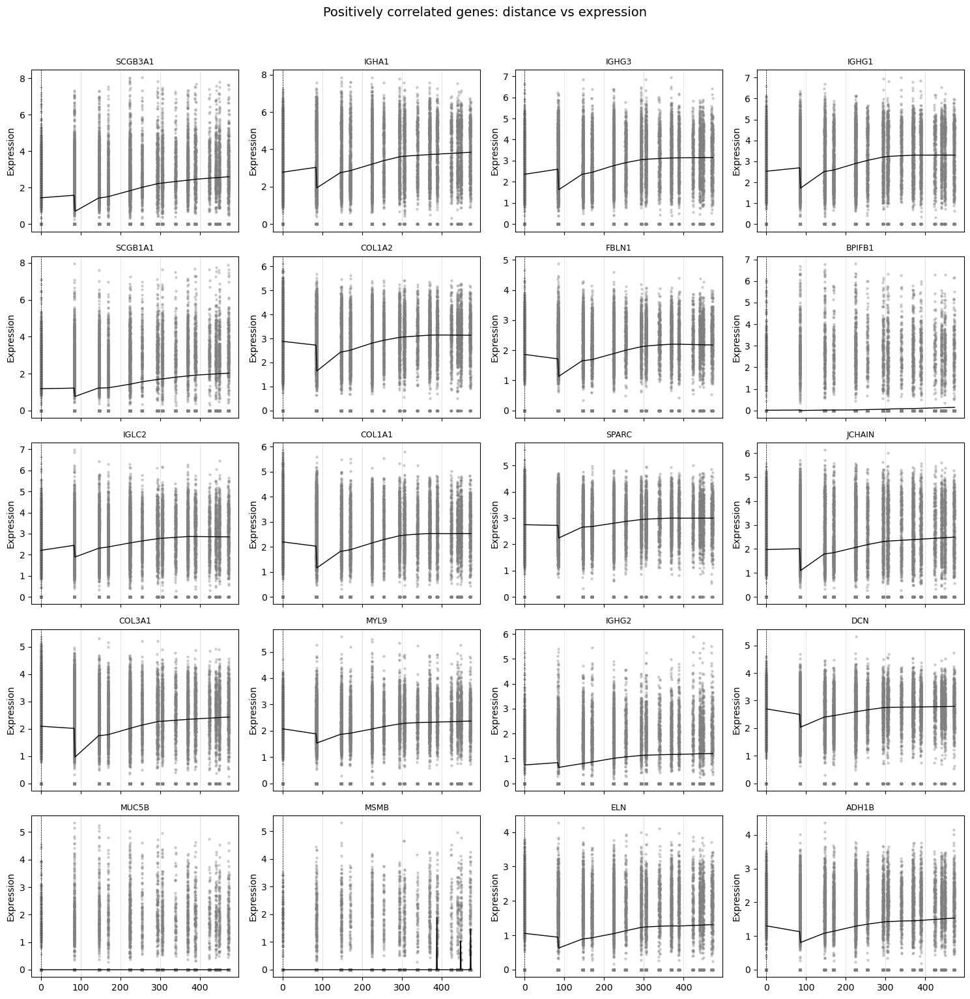

In [126]:
expr_df = pd.DataFrame(
    adata_sub[:, genes_pos].X.toarray(),
    index=adata_sub.obs_names,
    columns=genes_pos
).reset_index().melt(
    id_vars="index", value_vars=genes_pos,
    var_name="gene", value_name="expression"
)
expr_df["r_dist"] = adata_sub.obs.loc[expr_df["index"], "r_dist_FF_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)
ncols = 4
nrows = int(np.ceil(len(genes_pos)/ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 3*nrows), sharex=True)
axes = axes.flatten()

for i, gene in enumerate(genes_pos):
    df_g = expr_df.query("gene == @gene")
    x_smooth, y_smooth = smooth_curve(df_g["r_dist"], df_g["expression"], frac=0.3)
    axes[i].scatter(df_g["r_dist"], df_g["expression"], s=5, alpha=0.3, color="grey")
    axes[i].plot(x_smooth, y_smooth, color="black", lw=1)
    axes[i].axvline(0, ls="--", color="black", lw=0.5)
    axes[i].set_title(gene, fontsize=9)
    axes[i].set_ylabel("Expression")
    axes[i].grid(axis="x", color="grey", alpha=0.3, lw=0.5)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle("Positively correlated genes: distance vs expression", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

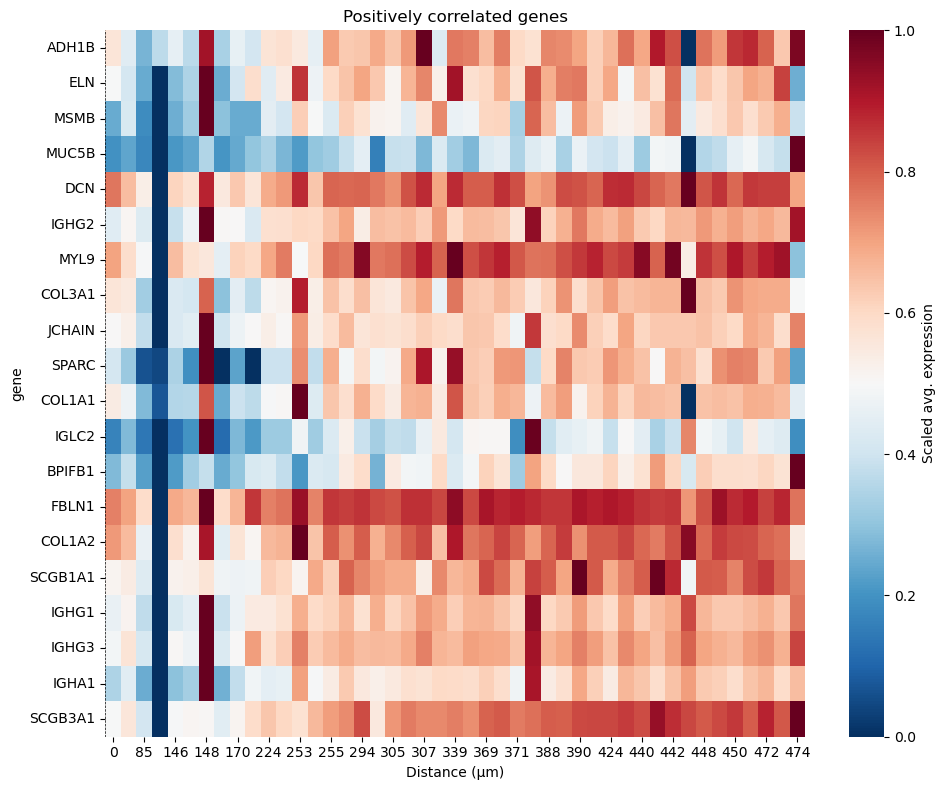

In [171]:
# long-format으로 변환: (spot, gene, expression, distance)
expr_df = pd.DataFrame(
    adata_sub[:, genes_pos].X.toarray(),
    index=adata_sub.obs_names,
    columns=genes_pos
).reset_index().melt(
    id_vars="index", value_vars=genes_pos,
    var_name="gene", value_name="expression"
)

expr_df["r_dist"] = adata_sub.obs.loc[expr_df["index"], "r_dist_FF_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)


avg_expr = (
    expr_df.groupby(["gene", "r_dist"])["expression"]
           .mean()
           .reset_index()
)

# 유전자별로 0–1 scaling
avg_expr["avg_expr_scaled"] = avg_expr.groupby("gene")["expression"].transform(
    lambda x: minmax_scale(x, feature_range=(0,1))
)
heatmap_data = avg_expr.pivot(index="gene", columns="r_dist", values="avg_expr_scaled")

# 유전자 순서를 correlation 높은 순서로 맞춤
heatmap_data = heatmap_data.reindex(index=genes_pos[::-1])

plt.figure(figsize=(10,8))
sns.heatmap(
    heatmap_data,
    cmap="RdBu_r",  # col_scale_lajolla 비슷한 팔레트
    cbar_kws={"label": "Scaled avg. expression"}
)
plt.axvline(x=np.where(heatmap_data.columns==0)[0][0], color="black", ls="--", lw=0.5)  # distance=0 선
plt.xlabel("Distance (µm)")
plt.title("Positively correlated genes")
plt.tight_layout()
plt.show()

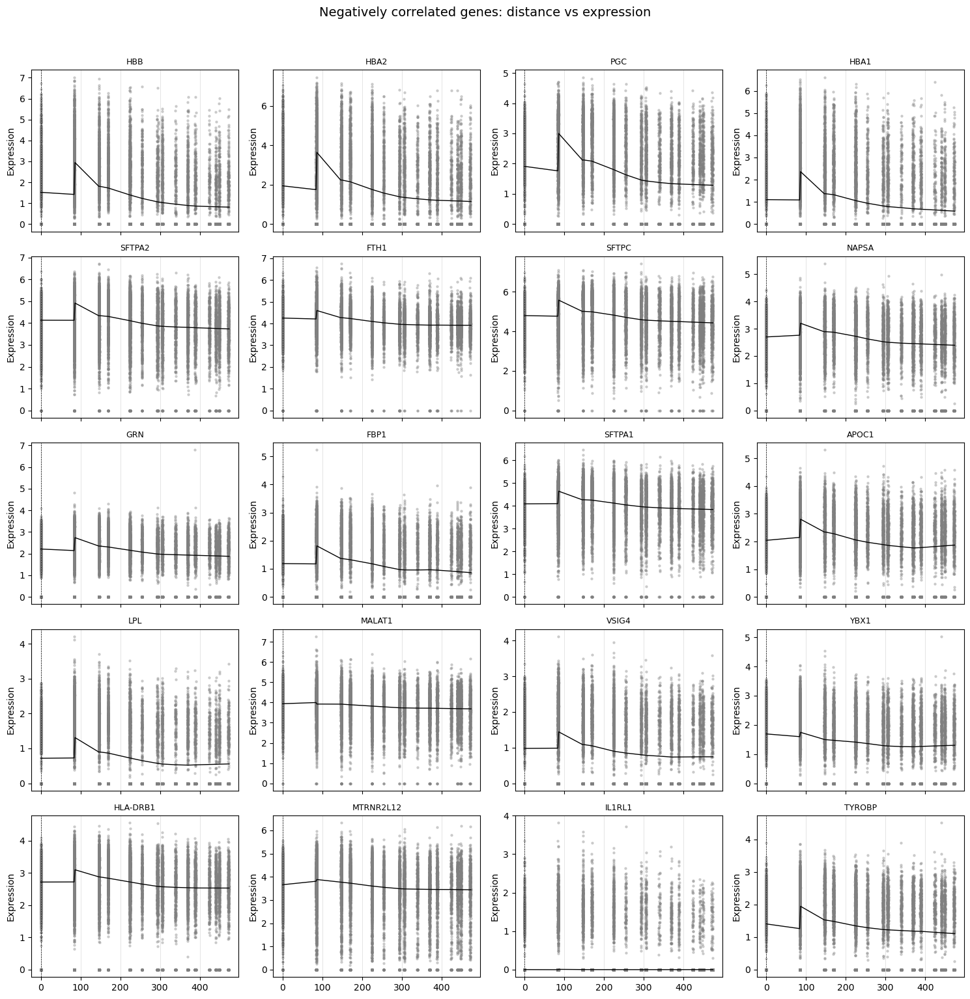

In [127]:
expr_df = pd.DataFrame(
    adata_sub[:, genes_neg].X.toarray(),
    index=adata_sub.obs_names,
    columns=genes_neg
).reset_index().melt(
    id_vars="index", value_vars=genes_neg,
    var_name="gene", value_name="expression"
)
expr_df["r_dist"] = adata_sub.obs.loc[expr_df["index"], "r_dist_FF_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)
ncols = 4
nrows = int(np.ceil(len(genes_neg)/ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 3*nrows), sharex=True)
axes = axes.flatten()

for i, gene in enumerate(genes_neg):
    df_g = expr_df.query("gene == @gene")
    x_smooth, y_smooth = smooth_curve(df_g["r_dist"], df_g["expression"], frac=0.3)
    axes[i].scatter(df_g["r_dist"], df_g["expression"], s=5, alpha=0.3, color="grey")
    axes[i].plot(x_smooth, y_smooth, color="black", lw=1)
    axes[i].axvline(0, ls="--", color="black", lw=0.5)
    axes[i].set_title(gene, fontsize=9)
    axes[i].set_ylabel("Expression")
    axes[i].grid(axis="x", color="grey", alpha=0.3, lw=0.5)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle("Negatively correlated genes: distance vs expression", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

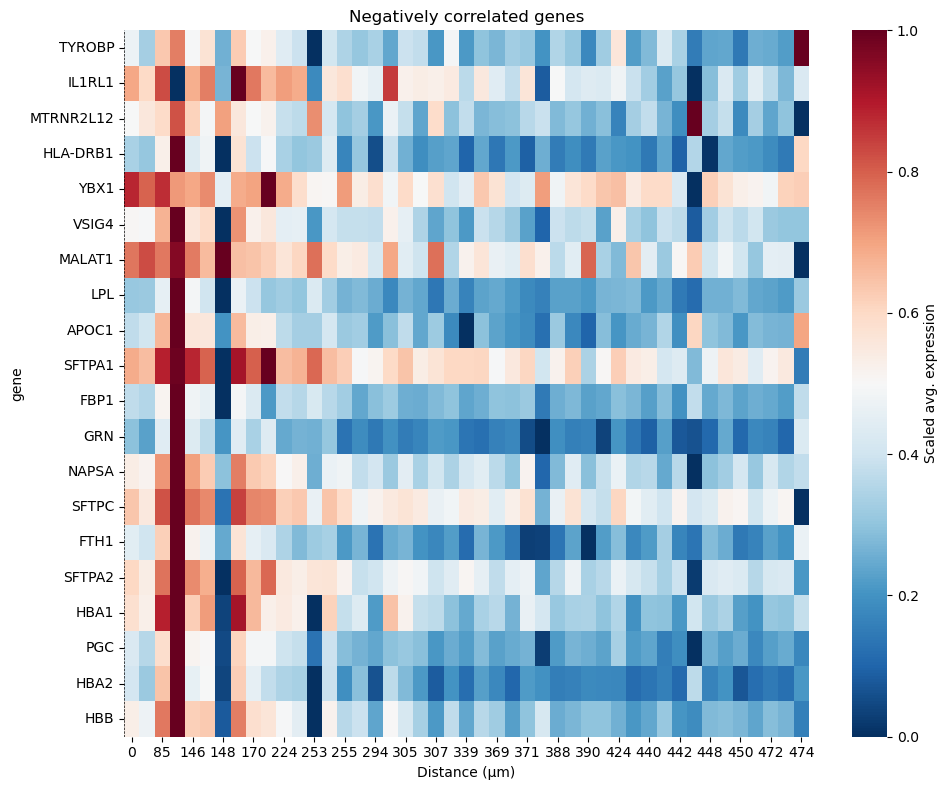

In [173]:
# long-format으로 변환: (spot, gene, expression, distance)
expr_df = pd.DataFrame(
    adata_sub[:, genes_neg].X.toarray(),
    index=adata_sub.obs_names,
    columns=genes_neg
).reset_index().melt(
    id_vars="index", value_vars=genes_neg,
    var_name="gene", value_name="expression"
)

expr_df["r_dist"] = adata_sub.obs.loc[expr_df["index"], "r_dist_FF_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)


avg_expr = (
    expr_df.groupby(["gene", "r_dist"])["expression"]
           .mean()
           .reset_index()
)

# 유전자별로 0–1 scaling
avg_expr["avg_expr_scaled"] = avg_expr.groupby("gene")["expression"].transform(
    lambda x: minmax_scale(x, feature_range=(0,1))
)
heatmap_data = avg_expr.pivot(index="gene", columns="r_dist", values="avg_expr_scaled")

# 유전자 순서를 correlation 높은 순서로 맞춤
heatmap_data = heatmap_data.reindex(index=genes_neg[::-1])

plt.figure(figsize=(10,8))
sns.heatmap(
    heatmap_data,
    cmap="RdBu_r",  # col_scale_lajolla 비슷한 팔레트
    cbar_kws={"label": "Scaled avg. expression"}
)
plt.axvline(x=np.where(heatmap_data.columns==0)[0][0], color="black", ls="--", lw=0.5)  # distance=0 선
plt.xlabel("Distance (µm)")
plt.title("Negatively correlated genes")
plt.tight_layout()
plt.show()

/tmp/ipykernel_1236025/2809484819.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=pos_cor, y="gene", x="cor", palette="RdBu")


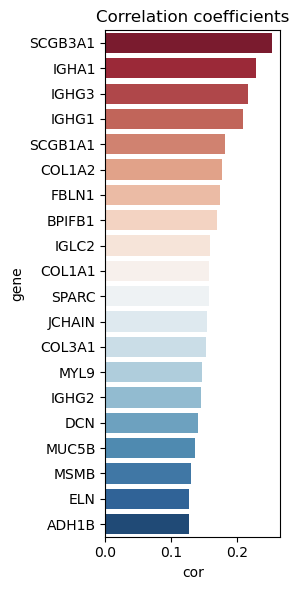

In [128]:
pos_cor = df_cor[df_cor["gene"].isin(genes_pos)].sort_values("cor", ascending=False)

plt.figure(figsize=(3,6))
sns.barplot(data=pos_cor, y="gene", x="cor", palette="RdBu")
plt.axvline(0, color="black", lw=0.5)
plt.title("Correlation coefficients")
plt.tight_layout()
plt.show()

/tmp/ipykernel_1236025/3033422190.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=neg_cor, y="gene", x="cor", palette="RdBu_r")


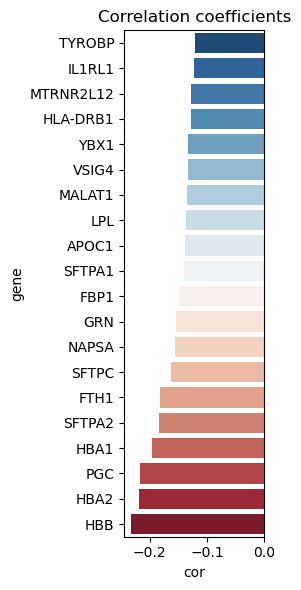

In [130]:
neg_cor = df_cor[df_cor["gene"].isin(genes_neg)].sort_values("cor", ascending=False)

plt.figure(figsize=(3,6))
sns.barplot(data=neg_cor, y="gene", x="cor", palette="RdBu_r")
plt.axvline(0, color="black", lw=0.5)
plt.title("Correlation coefficients")
plt.tight_layout()
plt.show()

In [189]:
features = ["Myofibroblast","Fibroblast","cDC1", "cDC2","T_CD4"]
results = []

x = adata_merged.obs["r_dist_FF_um"].values

for f in features:
    y = adata_merged.obs[f].values
    if np.var(y) > 0:
        r, p = pearsonr(x, y)
        results.append([f, r, p])

df_cell_cor = pd.DataFrame(results, columns=["feature", "cor", "pval"])

# 다중검정 보정
from statsmodels.stats.multitest import multipletests
df_cell_cor["padj"] = multipletests(df_cell_cor["pval"], method="fdr_bh")[1]

print(df_cell_cor)

         feature       cor           pval           padj
0  Myofibroblast  0.149978  3.194399e-183  1.597199e-182
1     Fibroblast  0.115617  3.360104e-109  5.600174e-109
2           cDC1 -0.137259  1.637138e-153  4.092846e-153
3           cDC2 -0.068835   1.014165e-39   1.267707e-39
4          T_CD4 -0.018932   2.907407e-04   2.907407e-04


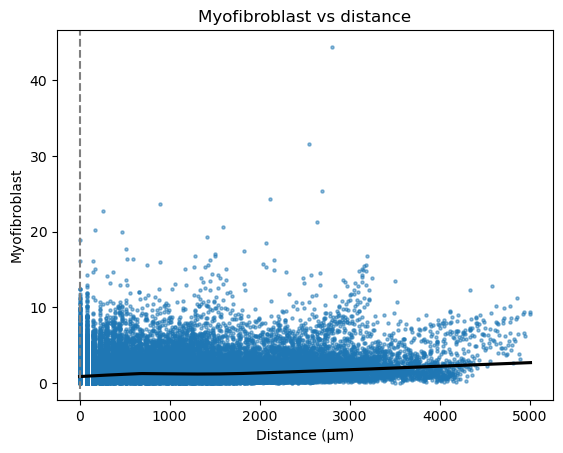

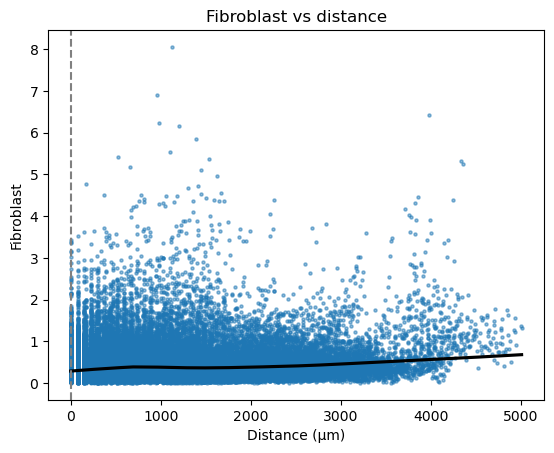

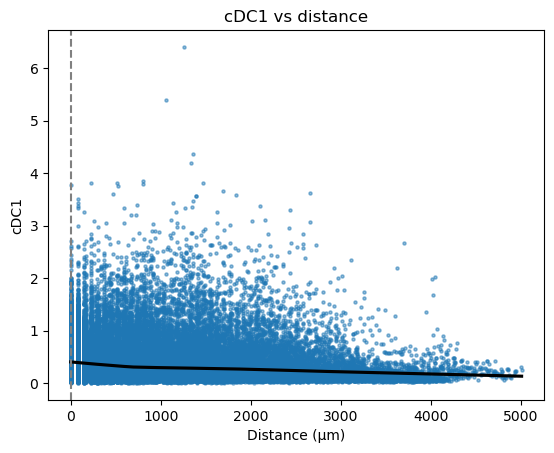

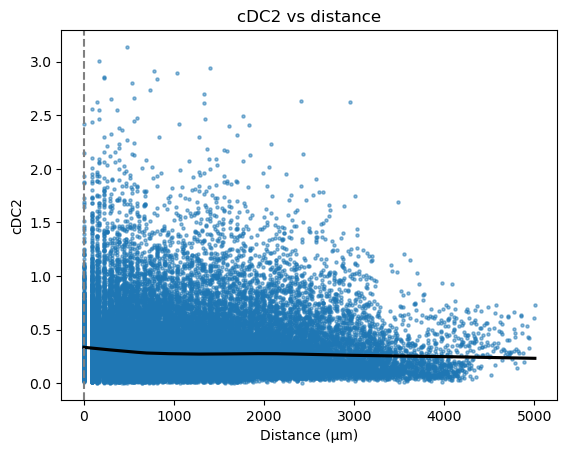

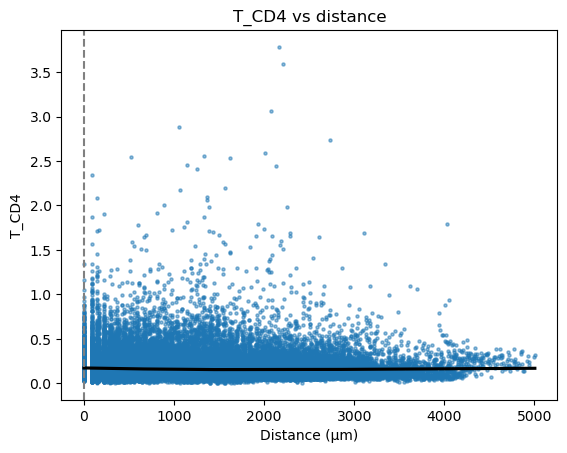

In [190]:
import seaborn as sns
import matplotlib.pyplot as plt

for f in features:
    sns.regplot(
        x="r_dist_FF_um", y=f, data=adata_merged.obs,
        scatter_kws={"s":5, "alpha":0.5}, lowess=True, line_kws={"color":"black"}
    )
    plt.axvline(0, ls="--", color="grey")
    plt.title(f"{f} vs distance")
    plt.xlabel("Distance (µm)")
    plt.ylabel(f)
    plt.show()

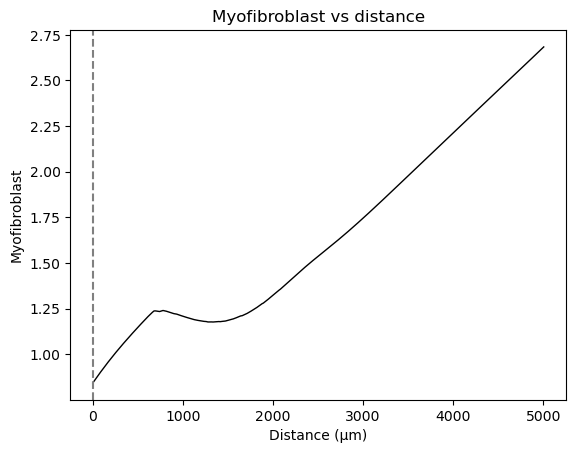

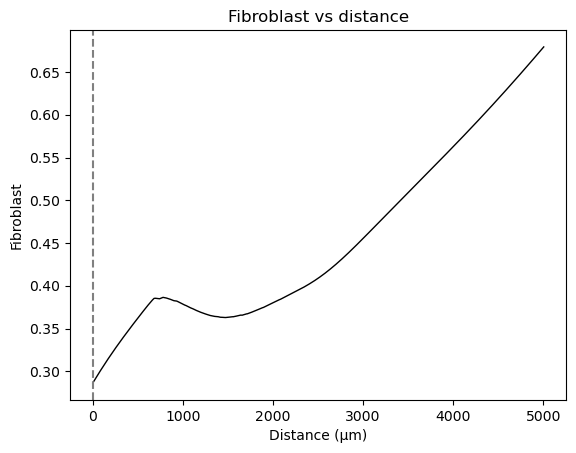

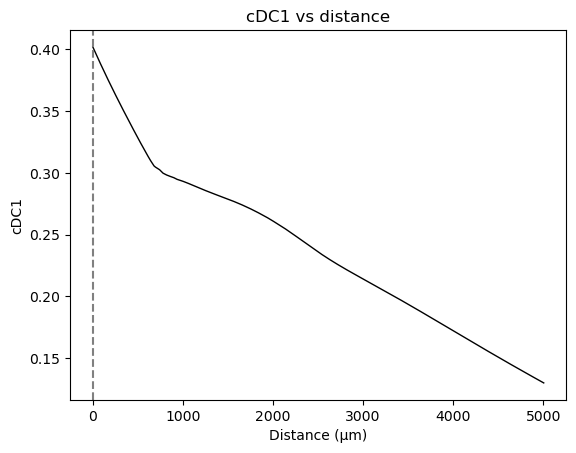

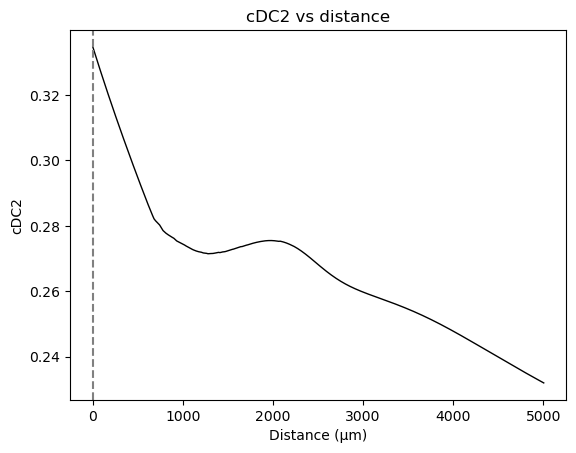

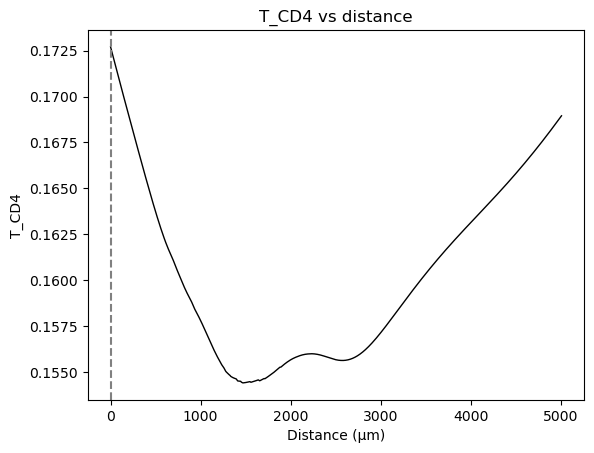

In [191]:
for f in features:
    sns.regplot(
        x="r_dist_FF_um", y=f, data=adata_merged.obs,
        scatter=False,               # 점 없애기
        lowess=True, line_kws={"color":"black", "lw":1}
    )
    plt.axvline(0, ls="--", color="grey")
    plt.title(f"{f} vs distance")
    plt.xlabel("Distance (µm)")
    plt.ylabel(f)
    plt.show()

In [192]:
adata_merged

AnnData object with n_obs × n_vars = 36628 × 13949
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'ATI', 'ATII', 'Aberrant_Basaloid', 'B', 'B_Plasma', 'Basal', 'Ciliated', 'Club', 'DC_Langerhans', 'DC_Mature', 'Fibroblast', 'Goblet', 'ILC_A', 'ILC_B', 'Ionocyte', 'Lymphatic', 'Macrophage', 'Macrophage_Alveolar', 'Mast', 'Mesothelial', 'Myofibroblast', 'NK', 'PNEC', 'Pericyte', 'SMC', 'T_CD4', 'T_Cytotoxic', 'T_PD1high', 'T_Regulatory', 'VE_Arterial', 'VE_Capillary_A', 'VE_Capillary_B', 'VE_Peribronchial', 'VE_Venous', 'cDC1', 'cDC2', 'cMonocyte', 'ncMonocyte', 'pDC', 'annotation', 'r_dist_FF', 'r_dist_FF_um', 'sample_batch'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

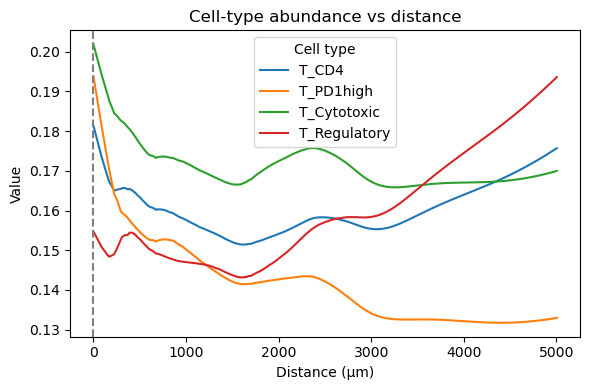

In [193]:
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess

features = ["T_CD4", "T_PD1high", "T_Cytotoxic", "T_Regulatory"]  # 예시
x = adata_merged.obs["r_dist_FF_um"].values

plt.figure(figsize=(6,4))

for f in features:
    y = adata_merged.obs[f].values
    smoothed = lowess(y, x, frac=0.3, return_sorted=True)  # LOESS smoothing
    plt.plot(smoothed[:,0], smoothed[:,1], label=f, lw=1.5)

plt.axvline(0, ls="--", color="grey")
plt.xlabel("Distance (µm)")
plt.ylabel("Value")
plt.title("Cell-type abundance vs distance")
plt.legend(title="Cell type")
plt.tight_layout()
plt.show()

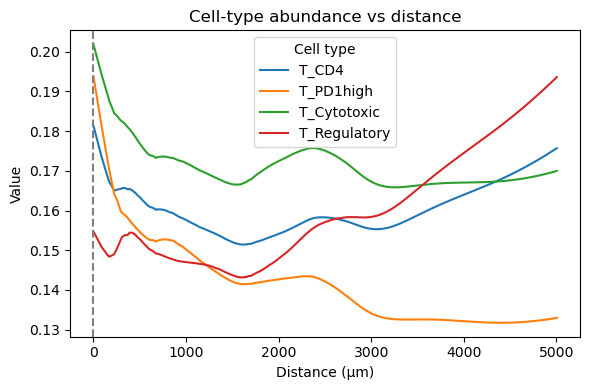

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess

features = ["T_CD4", "T_PD1high", "T_Cytotoxic", "T_Regulatory"]  # 예시
x = adata_merged.obs["r_dist_FF_um"].values

plt.figure(figsize=(6,4))

for f in features:
    y = adata_merged.obs[f].values
    smoothed = lowess(y, x, frac=0.3, return_sorted=True)  # LOESS smoothing
    plt.plot(smoothed[:,0], smoothed[:,1], label=f, lw=1.5)

plt.axvline(0, ls="--", color="grey")
plt.xlabel("Distance (µm)")
plt.ylabel("Value")
plt.title("Cell-type abundance vs distance")
plt.legend(title="Cell type")
plt.tight_layout()
plt.savefig("/home/jaehyunchoi/bystander_collaboration/Figure_script_IPF/Figures/IPF_spatial_distance_abundace.pdf", bbox_inches='tight', dpi=300)
plt.show()

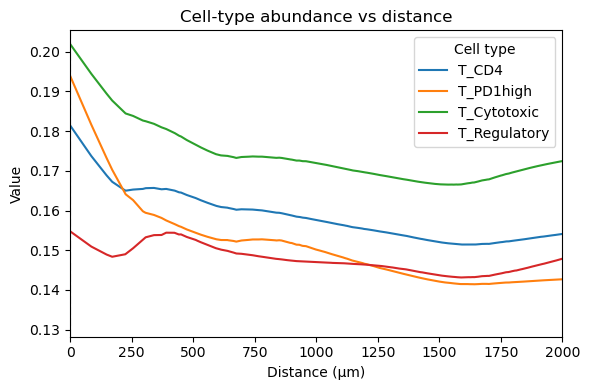

In [196]:
plt.figure(figsize=(6,4))

for f in features:
    y = adata_merged.obs[f].values
    smoothed = lowess(y, x, frac=0.3, return_sorted=True)
    plt.plot(smoothed[:,0], smoothed[:,1], label=f, lw=1.5)

plt.axvline(0, ls="--", color="grey")
plt.xlabel("Distance (µm)")
plt.ylabel("Value")
plt.title("Cell-type abundance vs distance")
plt.legend(title="Cell type")
plt.xlim(0, 2000)   # 👈 x축을 0–2000으로 고정
plt.tight_layout()
plt.show()

In [343]:
adata_merged

AnnData object with n_obs × n_vars = 36628 × 13949
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'ATI', 'ATII', 'Aberrant_Basaloid', 'B', 'B_Plasma', 'Basal', 'Ciliated', 'Club', 'DC_Langerhans', 'DC_Mature', 'Fibroblast', 'Goblet', 'ILC_A', 'ILC_B', 'Ionocyte', 'Lymphatic', 'Macrophage', 'Macrophage_Alveolar', 'Mast', 'Mesothelial', 'Myofibroblast', 'NK', 'PNEC', 'Pericyte', 'SMC', 'T_CD4', 'T_Cytotoxic', 'T_PD1high', 'T_Regulatory', 'VE_Arterial', 'VE_Capillary_A', 'VE_Capillary_B', 'VE_Peribronchial', 'VE_Venous', 'cDC1', 'cDC2', 'cMonocyte', 'ncMonocyte', 'pDC', 'annotation', 'r_dist_FF', 'r_dist_FF_um', 'sample_batch'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

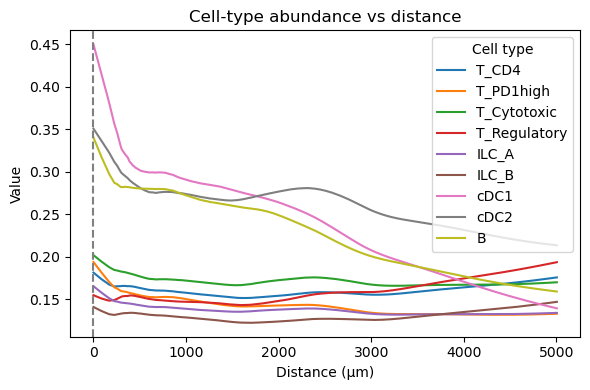

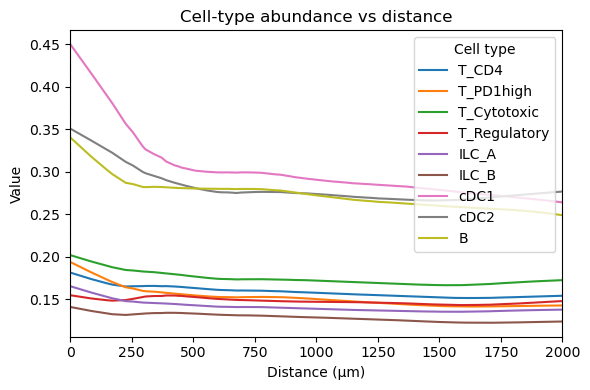

In [344]:
features = ["T_CD4", "T_PD1high", "T_Cytotoxic", "T_Regulatory","ILC_A","ILC_B","cDC1","cDC2","B"]
x = adata_merged.obs["r_dist_FF_um"].values

plt.figure(figsize=(6,4))

for f in features:
    y = adata_merged.obs[f].values
    smoothed = lowess(y, x, frac=0.3, return_sorted=True)  # LOESS smoothing
    plt.plot(smoothed[:,0], smoothed[:,1], label=f, lw=1.5)

plt.axvline(0, ls="--", color="grey")
plt.xlabel("Distance (µm)")
plt.ylabel("Value")
plt.title("Cell-type abundance vs distance")
plt.legend(title="Cell type")
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,4))

for f in features:
    y = adata_merged.obs[f].values
    smoothed = lowess(y, x, frac=0.3, return_sorted=True)
    plt.plot(smoothed[:,0], smoothed[:,1], label=f, lw=1.5)

plt.axvline(0, ls="--", color="grey")
plt.xlabel("Distance (µm)")
plt.ylabel("Value")
plt.title("Cell-type abundance vs distance")
plt.legend(title="Cell type")
plt.xlim(0, 2000)   # 👈 x축을 0–2000으로 고정
plt.tight_layout()
plt.show()

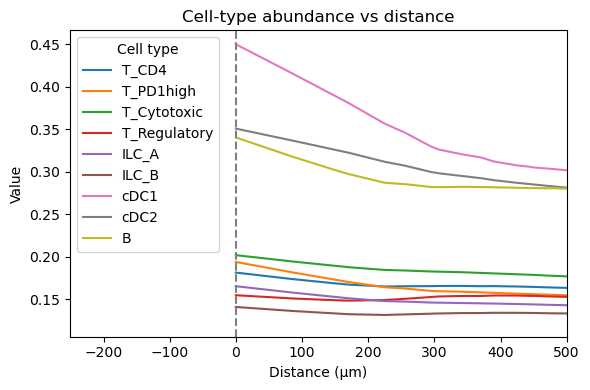

In [345]:
plt.figure(figsize=(6,4))

for f in features:
    y = adata_merged.obs[f].values
    smoothed = lowess(y, x, frac=0.3, return_sorted=True)
    plt.plot(smoothed[:,0], smoothed[:,1], label=f, lw=1.5)

plt.axvline(0, ls="--", color="grey")
plt.xlabel("Distance (µm)")
plt.ylabel("Value")
plt.title("Cell-type abundance vs distance")
plt.legend(title="Cell type")
plt.xlim(right=500)
plt.tight_layout()
plt.show()

# Radial distance analysis ( Histology = Inflammation)

In [238]:
adata = adata_281D1
scalef = scalef_281D1
Histology = "Inflammation"
dist_cutoff = 500

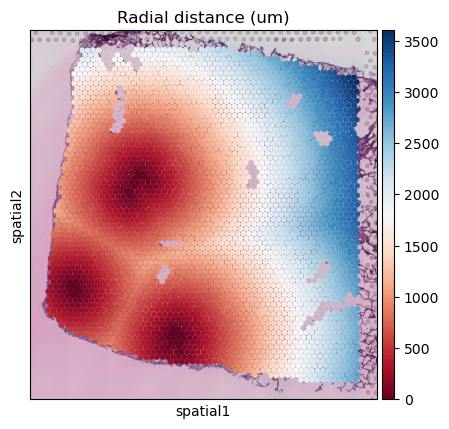

In [239]:
coords = adata.obsm["spatial"]
mask_FF = adata.obs["annotation"] == Histology
coords_FF = coords[mask_FF]
dist_matrix = cdist(coords, coords_FF, metric="euclidean")
min_dist = dist_matrix.min(axis=1)
adata.obs["r_dist_FF"] = min_dist
adata.obs["r_dist_FF_um"] = adata.obs["r_dist_FF"] * scalef
sc.pl.spatial(
    adata,
    color=["r_dist_FF_um"],
    img_key='hires',
    spot_size=30,
    size=5,
    title = "Radial distance (um)",
    cmap = "RdBu"
)

In [209]:
adata_281D1.obs['annotation'].value_counts()

annotation
Diseased                     1877
Normal Alveolar and Other    1237
Suspect Fibrosis              129
Large Airway                  126
Blood Vessel                   78
Inflammation                   37
Name: count, dtype: int64

In [210]:
from scipy.spatial.distance import cdist
import numpy as np
import scanpy as sc

samples = ["092B1","092C1","092D1","280B1","280C1","280D1","281B1", "281D1"]

processed_adatas = []

for sample in samples:
    adata = adata_dict[sample].copy()
    scalef = scalef_dict[sample]
    
    coords = adata.obsm["spatial"]
    
    # Histology 영역 필터링
    mask_Inf = adata.obs["annotation"] == "Inflammation"
    coords_Inf = coords[mask_Inf] 
    
    # 거리 계산
    dist_matrix = cdist(coords, coords_Inf, metric="euclidean")
    min_dist = dist_matrix.min(axis=1)
    
    # 거리 저장
    adata.obs["r_dist_Inf"] = min_dist
    adata.obs["r_dist_Inf_um"] = min_dist * scalef
    
    # sample 이름 저장
    adata.obs["sample"] = sample
    
    processed_adatas.append(adata)

In [211]:
adata_merged = processed_adatas[0].concatenate(
    *processed_adatas[1:],
    batch_key="sample_batch",
    batch_categories=samples
)

/tmp/ipykernel_1236025/129854757.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_merged = processed_adatas[0].concatenate(


In [214]:
adata_sub = adata_merged[adata_merged.obs["r_dist_Inf_um"] < 500].copy()

sc.pp.normalize_total(adata_sub, target_sum=1e4)
sc.pp.log1p(adata_sub)

sc.pp.highly_variable_genes(adata_sub, n_top_genes=1000, flavor="seurat_v3")

sel_genes = adata_sub.var[adata_sub.var["highly_variable"]].index

/home/jaehyunchoi/.conda/envs/spatial/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


In [215]:
results = []
for g in sel_genes:
    y = adata_sub[:, g].X.toarray().flatten()
    x = adata_sub.obs["r_dist_Inf_um"].values
    if np.var(y) > 0:
        r, p = pearsonr(x, y)
        results.append([g, r, p])

df_cor = pd.DataFrame(results, columns=["gene", "cor", "pval"])
# FDR 보정
from statsmodels.stats.multitest import multipletests
df_cor["padj"] = multipletests(df_cor["pval"], method="fdr_bh")[1]
df_cor.sort_values("padj", ascending=True)

,gene,cor,pval,padj
606,MS4A1,-0.229693,4.101134e-65,4.101134e-62
228,CXCL13,-0.224940,1.874767e-62,9.373836e-60
822,SFTPC,0.216961,3.994122e-58,1.331374e-55
911,TMEM107,-0.204373,1.215708e-51,3.039269e-49
770,RPS24,-0.185915,6.912331e-43,1.382466e-40
...,...,...,...,...
168,CFAP52,0.000224,9.869326e-01,9.908962e-01
842,SLC7A2,-0.000203,9.881369e-01,9.911102e-01
645,NEIL3,-0.000145,9.915255e-01,9.935125e-01
245,DLGAP2,0.000060,9.964687e-01,9.974662e-01


In [216]:
df_cor[df_cor["gene"].isin(["PDCD1", "AREG", "IL1RL1","LGALS1"])]

,gene,cor,pval,padj
529,LGALS1,0.124535,5.642145e-20,1.446704e-18


In [217]:
genes_pos = (
    df_cor.sort_values("cor", ascending=False)
          .query("padj < 0.05")              # sign_001 == TRUE 에 해당
          .head(n_genes)["gene"].tolist()
)
genes_neg = (
    df_cor.sort_values("cor", ascending=True)
          .query("pval < 0.05")
          .head(n_genes)["gene"].tolist()
)

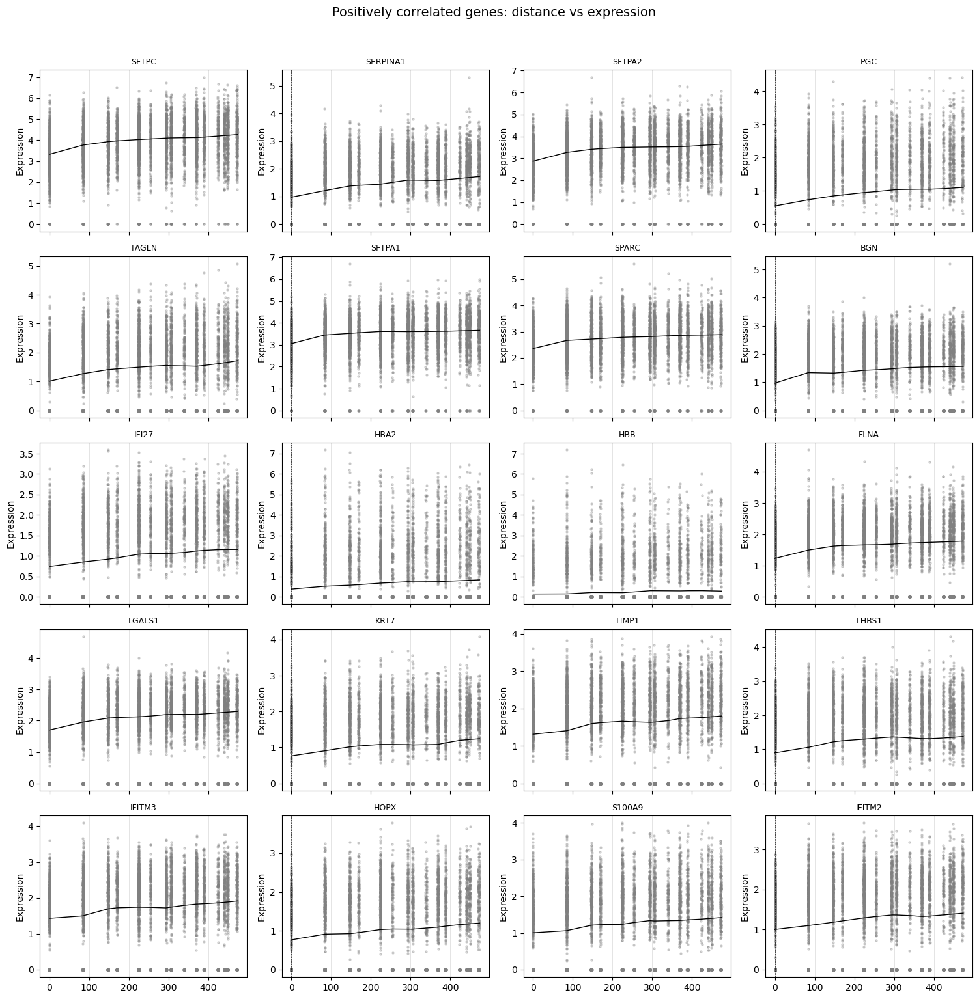

In [218]:
expr_df = pd.DataFrame(
    adata_sub[:, genes_pos].X.toarray(),
    index=adata_sub.obs_names,
    columns=genes_pos
).reset_index().melt(
    id_vars="index", value_vars=genes_pos,
    var_name="gene", value_name="expression"
)
expr_df["r_dist"] = adata_sub.obs.loc[expr_df["index"], "r_dist_Inf_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)
ncols = 4
nrows = int(np.ceil(len(genes_pos)/ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 3*nrows), sharex=True)
axes = axes.flatten()

for i, gene in enumerate(genes_pos):
    df_g = expr_df.query("gene == @gene")
    x_smooth, y_smooth = smooth_curve(df_g["r_dist"], df_g["expression"], frac=0.3)
    axes[i].scatter(df_g["r_dist"], df_g["expression"], s=5, alpha=0.3, color="grey")
    axes[i].plot(x_smooth, y_smooth, color="black", lw=1)
    axes[i].axvline(0, ls="--", color="black", lw=0.5)
    axes[i].set_title(gene, fontsize=9)
    axes[i].set_ylabel("Expression")
    axes[i].grid(axis="x", color="grey", alpha=0.3, lw=0.5)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle("Positively correlated genes: distance vs expression", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

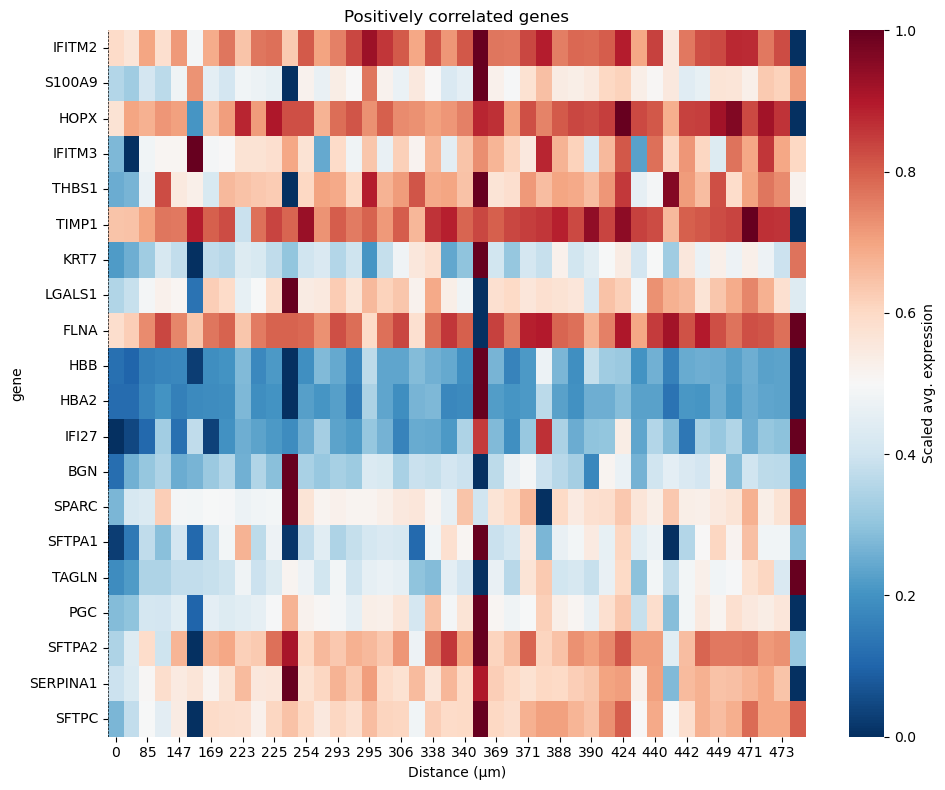

In [219]:
# long-format으로 변환: (spot, gene, expression, distance)
expr_df = pd.DataFrame(
    adata_sub[:, genes_pos].X.toarray(),
    index=adata_sub.obs_names,
    columns=genes_pos
).reset_index().melt(
    id_vars="index", value_vars=genes_pos,
    var_name="gene", value_name="expression"
)

expr_df["r_dist"] = adata_sub.obs.loc[expr_df["index"], "r_dist_Inf_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)


avg_expr = (
    expr_df.groupby(["gene", "r_dist"])["expression"]
           .mean()
           .reset_index()
)

# 유전자별로 0–1 scaling
avg_expr["avg_expr_scaled"] = avg_expr.groupby("gene")["expression"].transform(
    lambda x: minmax_scale(x, feature_range=(0,1))
)
heatmap_data = avg_expr.pivot(index="gene", columns="r_dist", values="avg_expr_scaled")

# 유전자 순서를 correlation 높은 순서로 맞춤
heatmap_data = heatmap_data.reindex(index=genes_pos[::-1])

plt.figure(figsize=(10,8))
sns.heatmap(
    heatmap_data,
    cmap="RdBu_r",  # col_scale_lajolla 비슷한 팔레트
    cbar_kws={"label": "Scaled avg. expression"}
)
plt.axvline(x=np.where(heatmap_data.columns==0)[0][0], color="black", ls="--", lw=0.5)  # distance=0 선
plt.xlabel("Distance (µm)")
plt.title("Positively correlated genes")
plt.tight_layout()
plt.show()

/tmp/ipykernel_1236025/2809484819.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=pos_cor, y="gene", x="cor", palette="RdBu")


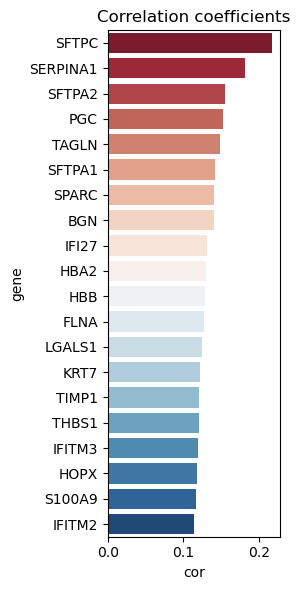

In [220]:
pos_cor = df_cor[df_cor["gene"].isin(genes_pos)].sort_values("cor", ascending=False)

plt.figure(figsize=(3,6))
sns.barplot(data=pos_cor, y="gene", x="cor", palette="RdBu")
plt.axvline(0, color="black", lw=0.5)
plt.title("Correlation coefficients")
plt.tight_layout()
plt.show()

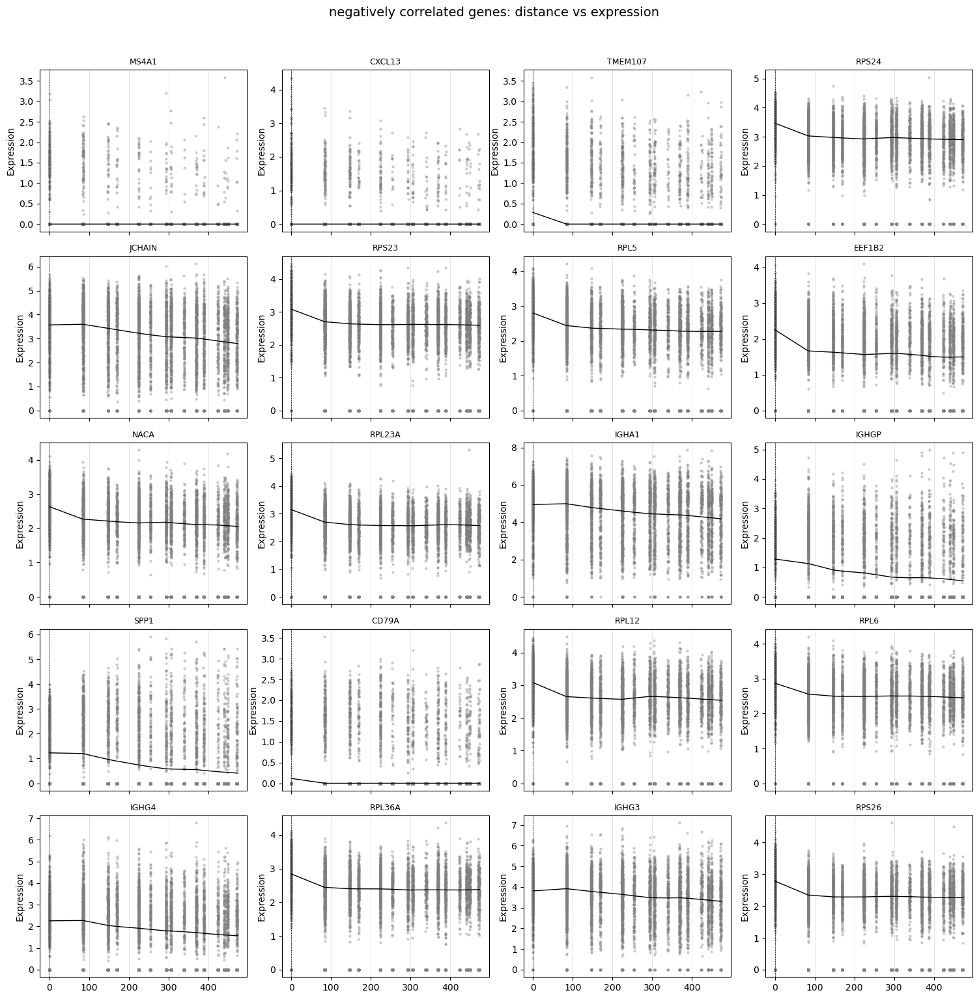

In [221]:
expr_df = pd.DataFrame(
    adata_sub[:, genes_neg].X.toarray(),
    index=adata_sub.obs_names,
    columns=genes_neg
).reset_index().melt(
    id_vars="index", value_vars=genes_neg,
    var_name="gene", value_name="expression"
)
expr_df["r_dist"] = adata_sub.obs.loc[expr_df["index"], "r_dist_Inf_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)
ncols = 4
nrows = int(np.ceil(len(genes_neg)/ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 3*nrows), sharex=True)
axes = axes.flatten()

for i, gene in enumerate(genes_neg):
    df_g = expr_df.query("gene == @gene")
    x_smooth, y_smooth = smooth_curve(df_g["r_dist"], df_g["expression"], frac=0.3)
    axes[i].scatter(df_g["r_dist"], df_g["expression"], s=5, alpha=0.3, color="grey")
    axes[i].plot(x_smooth, y_smooth, color="black", lw=1)
    axes[i].axvline(0, ls="--", color="black", lw=0.5)
    axes[i].set_title(gene, fontsize=9)
    axes[i].set_ylabel("Expression")
    axes[i].grid(axis="x", color="grey", alpha=0.3, lw=0.5)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle("negatively correlated genes: distance vs expression", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

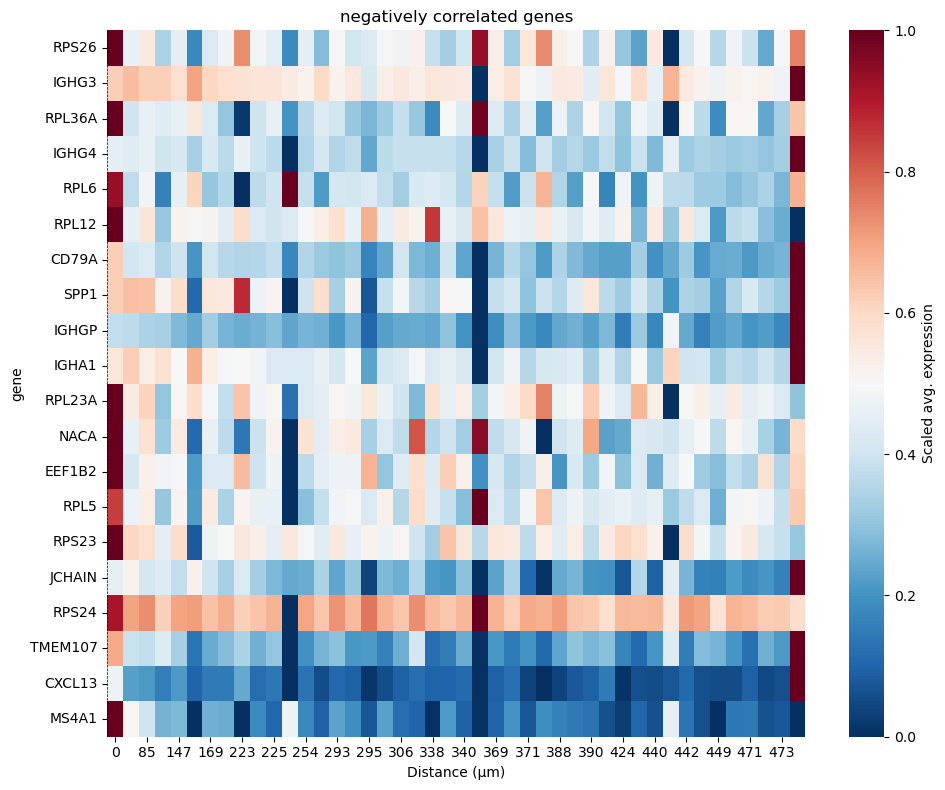

In [222]:
# long-format으로 변환: (spot, gene, expression, distance)
expr_df = pd.DataFrame(
    adata_sub[:, genes_neg].X.toarray(),
    index=adata_sub.obs_names,
    columns=genes_neg
).reset_index().melt(
    id_vars="index", value_vars=genes_neg,
    var_name="gene", value_name="expression"
)

expr_df["r_dist"] = adata_sub.obs.loc[expr_df["index"], "r_dist_Inf_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)


avg_expr = (
    expr_df.groupby(["gene", "r_dist"])["expression"]
           .mean()
           .reset_index()
)

# 유전자별로 0–1 scaling
avg_expr["avg_expr_scaled"] = avg_expr.groupby("gene")["expression"].transform(
    lambda x: minmax_scale(x, feature_range=(0,1))
)
heatmap_data = avg_expr.pivot(index="gene", columns="r_dist", values="avg_expr_scaled")

# 유전자 순서를 correlation 높은 순서로 맞춤
heatmap_data = heatmap_data.reindex(index=genes_neg[::-1])

plt.figure(figsize=(10,8))
sns.heatmap(
    heatmap_data,
    cmap="RdBu_r",  # col_scale_lajolla 비슷한 팔레트
    cbar_kws={"label": "Scaled avg. expression"}
)
plt.axvline(x=np.where(heatmap_data.columns==0)[0][0], color="black", ls="--", lw=0.5)  # distance=0 선
plt.xlabel("Distance (µm)")
plt.title("negatively correlated genes")
plt.tight_layout()
plt.show()

/tmp/ipykernel_1236025/3033422190.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=neg_cor, y="gene", x="cor", palette="RdBu_r")


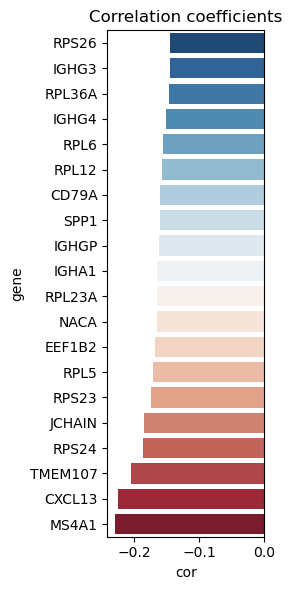

In [244]:
neg_cor = df_cor[df_cor["gene"].isin(genes_neg)].sort_values("cor", ascending=False)

plt.figure(figsize=(3,6))
sns.barplot(data=neg_cor, y="gene", x="cor", palette="RdBu_r")
plt.axvline(0, color="black", lw=0.5)
plt.title("Correlation coefficients")
plt.tight_layout()
plt.show()

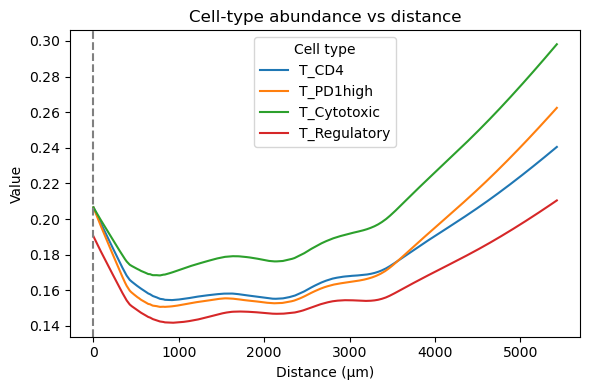

In [241]:
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess

features = ["T_CD4", "T_PD1high", "T_Cytotoxic", "T_Regulatory"]  # 예시
x = adata_merged.obs["r_dist_Inf_um"].values

plt.figure(figsize=(6,4))

for f in features:
    y = adata_merged.obs[f].values
    smoothed = lowess(y, x, frac=0.3, return_sorted=True)  # LOESS smoothing
    plt.plot(smoothed[:,0], smoothed[:,1], label=f, lw=1.5)

plt.axvline(0, ls="--", color="grey")
plt.xlabel("Distance (µm)")
plt.ylabel("Value")
plt.title("Cell-type abundance vs distance")
plt.legend(title="Cell type")
plt.tight_layout()
plt.show()

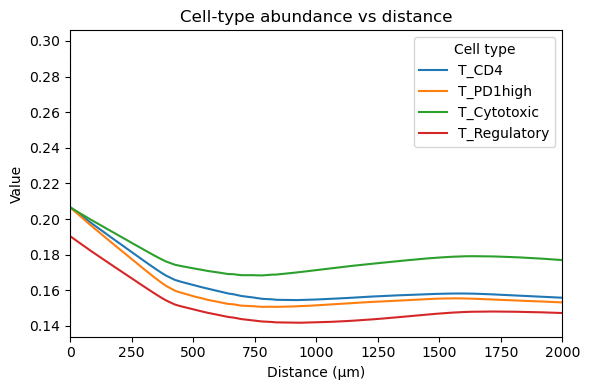

In [242]:
plt.figure(figsize=(6,4))

for f in features:
    y = adata_merged.obs[f].values
    smoothed = lowess(y, x, frac=0.3, return_sorted=True)
    plt.plot(smoothed[:,0], smoothed[:,1], label=f, lw=1.5)

plt.axvline(0, ls="--", color="grey")
plt.xlabel("Distance (µm)")
plt.ylabel("Value")
plt.title("Cell-type abundance vs distance")
plt.legend(title="Cell type")
plt.xlim(0, 2000)   # 👈 x축을 0–2000으로 고정
plt.tight_layout()
plt.show()

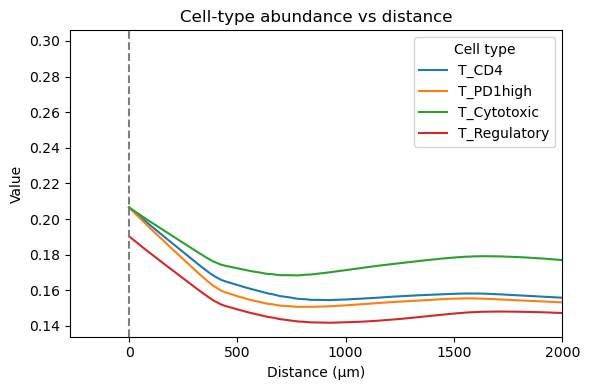

In [243]:
plt.figure(figsize=(6,4))

for f in features:
    y = adata_merged.obs[f].values
    smoothed = lowess(y, x, frac=0.3, return_sorted=True)
    plt.plot(smoothed[:,0], smoothed[:,1], label=f, lw=1.5)

plt.axvline(0, ls="--", color="grey")
plt.xlabel("Distance (µm)")
plt.ylabel("Value")
plt.title("Cell-type abundance vs distance")
plt.legend(title="Cell type")
plt.xlim(right=2000)   # 👈 최대값만 2000으로 설정, 최소값은 자동
plt.tight_layout()
plt.show()

# Distance analysis from Myofibroblast

In [4]:
from statsmodels.nonparametric.smoothers_lowess import lowess
def smooth_curve(x, y, frac=0.3):
    """LOESS smoothing"""
    smoothed = lowess(y, x, frac=frac, return_sorted=True)
    return smoothed[:,0], smoothed[:,1]

In [7]:
from scipy.spatial.distance import cdist
import numpy as np
import scanpy as sc

samples = ["092A1","092B1","092C1","092D1","015A1", "015B1","015C1", "015D1","019A1","051B1","051C1",
           "051D1","279B1","279C1","279D1","280A1","280B1","280C1","280D1", "281A1","281B1","281C1", "281D1","282A1","282B1"]

processed_adatas = []

for sample in samples:
    adata = adata_dict[sample].copy()
    scalef = scalef_dict[sample]
    
    coords = adata.obsm["spatial"]
    
    # Histology 영역 필터링
    #mask_FF = adata.obs["annotation"] == "Suspect Fibrosis"
    #coords_FF = coords[mask_FF] 
    
    # 거리 계산
    #dist_matrix = cdist(coords, coords_FF, metric="euclidean")
    #min_dist = dist_matrix.min(axis=1)
    
    # 거리 저장
    #adata.obs["r_dist_FF"] = min_dist
    #adata.obs["r_dist_FF_um"] = min_dist * scalef
    
    # sample 이름 저장
    adata.obs["sample"] = sample
    
    processed_adatas.append(adata)

adata_merged = processed_adatas[0].concatenate(
    *processed_adatas[1:],
    batch_key="sample_batch",
    batch_categories=samples
)
adata_merged

/tmp/ipykernel_1577323/3217796295.py:33: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_merged = processed_adatas[0].concatenate(


AnnData object with n_obs × n_vars = 101907 × 13949
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'ATI', 'ATII', 'Aberrant_Basaloid', 'B', 'B_Plasma', 'Basal', 'Ciliated', 'Club', 'DC_Langerhans', 'DC_Mature', 'Fibroblast', 'Goblet', 'ILC_A', 'ILC_B', 'Ionocyte', 'Lymphatic', 'Macrophage', 'Macrophage_Alveolar', 'Mast', 'Mesothelial', 'Myofibroblast', 'NK', 'PNEC', 'Pericyte', 'SMC', 'T_CD4', 'T_Cytotoxic', 'T_PD1high', 'T_Regulatory', 'VE_Arterial', 'VE_Capillary_A', 'VE_Capillary_B', 'VE_Peribronchial', 'VE_Venous', 'cDC1', 'cDC2', 'cMonocyte', 'ncMonocyte', 'pDC', 'annotation', 'sample_batch'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [8]:
cutoff = np.percentile(adata_merged.obs["Myofibroblast"], 99)
mask_myo = adata_merged.obs["Myofibroblast"] >= cutoff

In [9]:
adata_merged.obs["myo_top"] = mask_myo.astype(int)

In [10]:
coords = adata_merged.obsm["spatial"]
coords_myo = coords[mask_myo]

print("Total spots:", adata_merged.n_obs)
print("Top 1% spots:", mask_myo.sum())

Total spots: 101907
Top 1% spots: 1020


In [11]:
cutoff = np.percentile(adata_merged.obs["Fibroblast"], 99)
mask_fibro = adata_merged.obs["Fibroblast"] >= cutoff
adata_merged.obs["fibro_top"] = mask_fibro.astype(int)
coords = adata_merged.obsm["spatial"]
coords_fibro = coords[mask_fibro]

print("Total spots:", adata_merged.n_obs)
print("Top 1% spots:", mask_fibro.sum())

Total spots: 101907
Top 1% spots: 1020


In [305]:
cutoff = np.percentile(adata_merged.obs["T_PD1high"], 99)
mask_pd1 = adata_merged.obs["T_PD1high"] >= cutoff
adata_merged.obs["pd1_top"] = mask_pd1.astype(int)
coords = adata_merged.obsm["spatial"]
coords_fibro = coords[mask_pd1]

print("Total spots:", adata_merged.n_obs)
print("Top 1% spots:", mask_pd1.sum())

Total spots: 101907
Top 1% spots: 1020


In [307]:
cutoff = np.percentile(adata_merged.obs["T_CD4"], 99)
mask_nonpd1 = adata_merged.obs["T_CD4"] >= cutoff
adata_merged.obs["nonpd1_top"] = mask_nonpd1.astype(int)
coords = adata_merged.obsm["spatial"]
coords_fibro = coords[mask_nonpd1]

print("Total spots:", adata_merged.n_obs)
print("Top 1% spots:", mask_nonpd1.sum())

Total spots: 101907
Top 1% spots: 1020


In [308]:
cutoff = np.percentile(adata_merged.obs["T_Regulatory"], 99)
mask_treg = adata_merged.obs["T_Regulatory"] >= cutoff
adata_merged.obs["treg_top"] = mask_treg.astype(int)
coords = adata_merged.obsm["spatial"]
coords_fibro = coords[mask_treg]

print("Total spots:", adata_merged.n_obs)
print("Top 1% spots:", mask_treg.sum())

Total spots: 101907
Top 1% spots: 1020


In [309]:
adata_merged.write("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/analysis/Radial_distance.h5ad")

In [258]:
pd.crosstab(adata_merged.obs["sample_batch"], adata_merged.obs["myo_top"])

myo_top,0,1
sample_batch,,
092A1,4199,0
092B1,4120,1
092C1,4542,20
092D1,3941,45
015A1,3643,0
015B1,4087,44
015C1,4735,5
015D1,3239,1
019A1,4393,0


In [12]:
split_adatas = {
    sample: adata_merged[adata_merged.obs["sample_batch"] == sample].copy()
    for sample in samples
}

# 예: 특정 샘플 불러오기
#adata_092B1 = split_adatas["092B1"]
#adata_282B1 = split_adatas["282B1"]

In [13]:
samples = ["092B1","092C1","092D1", "015B1","015C1", "015D1","051B1","051C1",
           "051D1","279C1","279D1","280B1","280C1","280D1","281B1","281C1", "281D1","282B1"]

processed_adatas = []

for sample in samples:
    adata = split_adatas[sample].copy()
    scalef = scalef_dict[sample]
    
    coords = adata.obsm["spatial"]
    
    # Histology 영역 필터링
    mask_myo = adata.obs["myo_top"] == 1
    coords_myo = coords[mask_myo] 

    dist_matrix = cdist(coords, coords_myo, metric="euclidean")
    min_dist = dist_matrix.min(axis=1)

    adata.obs["r_dist_myo"] = min_dist
    adata.obs["r_dist_myo_um"] = min_dist * scalef
    
    # sample 이름 저장
    adata.obs["sample"] = sample
    
    processed_adatas.append(adata)

adata_merged = processed_adatas[0].concatenate(
    *processed_adatas[1:],
    batch_key="sample_batch",
    batch_categories=samples
)
adata_merged

/tmp/ipykernel_1577323/2612986138.py:27: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_merged = processed_adatas[0].concatenate(


AnnData object with n_obs × n_vars = 72674 × 13949
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'ATI', 'ATII', 'Aberrant_Basaloid', 'B', 'B_Plasma', 'Basal', 'Ciliated', 'Club', 'DC_Langerhans', 'DC_Mature', 'Fibroblast', 'Goblet', 'ILC_A', 'ILC_B', 'Ionocyte', 'Lymphatic', 'Macrophage', 'Macrophage_Alveolar', 'Mast', 'Mesothelial', 'Myofibroblast', 'NK', 'PNEC', 'Pericyte', 'SMC', 'T_CD4', 'T_Cytotoxic', 'T_PD1high', 'T_Regulatory', 'VE_Arterial', 'VE_Capillary_A', 'VE_Capillary_B', 'VE_Peribronchial', 'VE_Venous', 'cDC1', 'cDC2', 'cMonocyte', 'ncMonocyte', 'pDC', 'annotation', 'sample_batch', 'myo_top', 'fibro_top', 'r_dist_myo', 'r_dist_myo_um'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

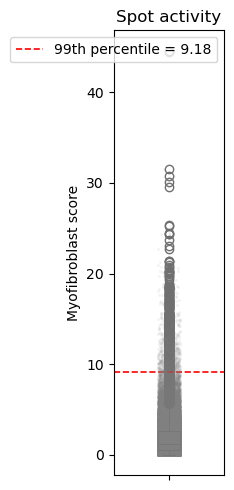

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

scores = adata_merged.obs["Myofibroblast"]
cutoff = np.percentile(scores, 99)

plt.figure(figsize=(2,5))
sns.boxplot(y=scores, color="skyblue", width=0.2)
sns.stripplot(y=scores, color="grey", size=2, alpha=0.1)  # optional: 점도 같이 표시
plt.axhline(cutoff, color="red", ls="--", lw=1.2, label=f"99th percentile = {cutoff:.2f}")

plt.ylabel("Myofibroblast score")
plt.title("Spot activity")
plt.legend()
plt.tight_layout()
plt.show()

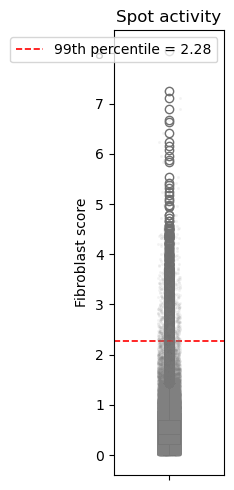

In [15]:
scores = adata_merged.obs["Fibroblast"]
cutoff = np.percentile(scores, 99)

plt.figure(figsize=(2,5))
sns.boxplot(y=scores, color="skyblue", width=0.2)
sns.stripplot(y=scores, color="grey", size=2, alpha=0.1)  # optional: 점도 같이 표시
plt.axhline(cutoff, color="red", ls="--", lw=1.2, label=f"99th percentile = {cutoff:.2f}")

plt.ylabel("Fibroblast score")
plt.title("Spot activity")
plt.legend()
plt.tight_layout()
plt.show()

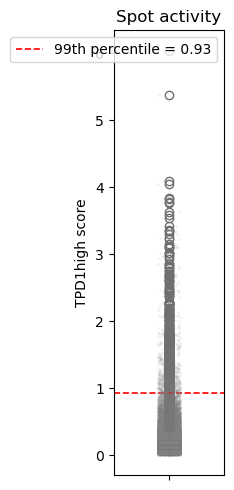

In [16]:
scores = adata_merged.obs["T_PD1high"]
cutoff = np.percentile(scores, 99)

plt.figure(figsize=(2,5))
sns.boxplot(y=scores, color="skyblue", width=0.2)
sns.stripplot(y=scores, color="grey", size=2, alpha=0.1)  # optional: 점도 같이 표시
plt.axhline(cutoff, color="red", ls="--", lw=1.2, label=f"99th percentile = {cutoff:.2f}")

plt.ylabel("TPD1high score")
plt.title("Spot activity")
plt.legend()
plt.tight_layout()
plt.show()

/home/jaehyunchoi/.conda/envs/spatial/lib/python3.10/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/jaehyunchoi/.conda/envs/spatial/lib/python3.10/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


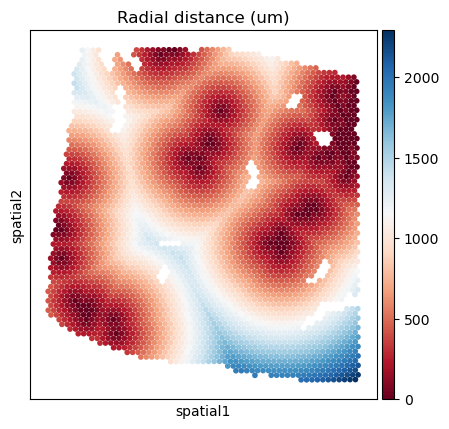

In [17]:
sc.pl.spatial(
    adata_merged[adata_merged.obs['sample_batch']=='281D1'],
    color=["r_dist_myo_um"],
    img_key='hires',
    spot_size=30,
    size=5,
    title = "Radial distance (um)",
    cmap = "RdBu"
)

In [18]:
dist_cutoff = 500
adata_sub = adata_merged[adata_merged.obs["r_dist_myo_um"] < dist_cutoff].copy()

sc.pp.normalize_total(adata_sub, target_sum=1e4)
sc.pp.log1p(adata_sub)

sc.pp.highly_variable_genes(adata_sub, n_top_genes=1000, flavor="seurat_v3")

sel_genes = adata_sub.var[adata_sub.var["highly_variable"]].index

/home/jaehyunchoi/.conda/envs/spatial/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


In [19]:
results = []
for g in sel_genes:
    y = adata_sub[:, g].X.toarray().flatten()
    x = adata_sub.obs["r_dist_myo_um"].values
    if np.var(y) > 0:
        r, p = pearsonr(x, y)
        results.append([g, r, p])

df_cor = pd.DataFrame(results, columns=["gene", "cor", "pval"])
# FDR 보정
from statsmodels.stats.multitest import multipletests
df_cor["padj"] = multipletests(df_cor["pval"], method="fdr_bh")[1]
df_cor.sort_values("padj", ascending=True)

,gene,cor,pval,padj
857,SPARC,-0.338428,0.000000,0.000000
716,POSTN,-0.279743,0.000000,0.000000
577,LUM,-0.296371,0.000000,0.000000
179,COL5A2,-0.303482,0.000000,0.000000
178,COL5A1,-0.321548,0.000000,0.000000
...,...,...,...,...
225,DACH2,0.000099,0.988238,0.990219
0,AADACL2,-0.000124,0.985219,0.990219
451,IGKV1D-8,-0.000106,0.987384,0.990219
967,VIT,-0.000013,0.998459,0.998459


In [20]:
df_cor[df_cor["gene"].isin(["PDCD1", "AREG", "IL1RL1","LGALS1"])]

,gene,cor,pval,padj
489,IL1RL1,0.019198,4.208072e-03,1.230430e-02
536,LGALS1,-0.219252,4.573638e-240,1.759091e-238


In [22]:
df_cor.sort_values("padj", ascending=True)

,gene,cor,pval,padj
857,SPARC,-0.338428,0.000000,0.000000
716,POSTN,-0.279743,0.000000,0.000000
577,LUM,-0.296371,0.000000,0.000000
179,COL5A2,-0.303482,0.000000,0.000000
178,COL5A1,-0.321548,0.000000,0.000000
...,...,...,...,...
225,DACH2,0.000099,0.988238,0.990219
0,AADACL2,-0.000124,0.985219,0.990219
451,IGKV1D-8,-0.000106,0.987384,0.990219
967,VIT,-0.000013,0.998459,0.998459


In [23]:
n_genes=20
genes_pos = (
    df_cor.sort_values("cor", ascending=False)
          .query("padj < 0.05")              # sign_001 == TRUE 에 해당
          .head(n_genes)["gene"].tolist()
)
genes_neg = (
    df_cor.sort_values("cor", ascending=True)
          .query("pval < 0.05")
          .head(n_genes)["gene"].tolist()
)

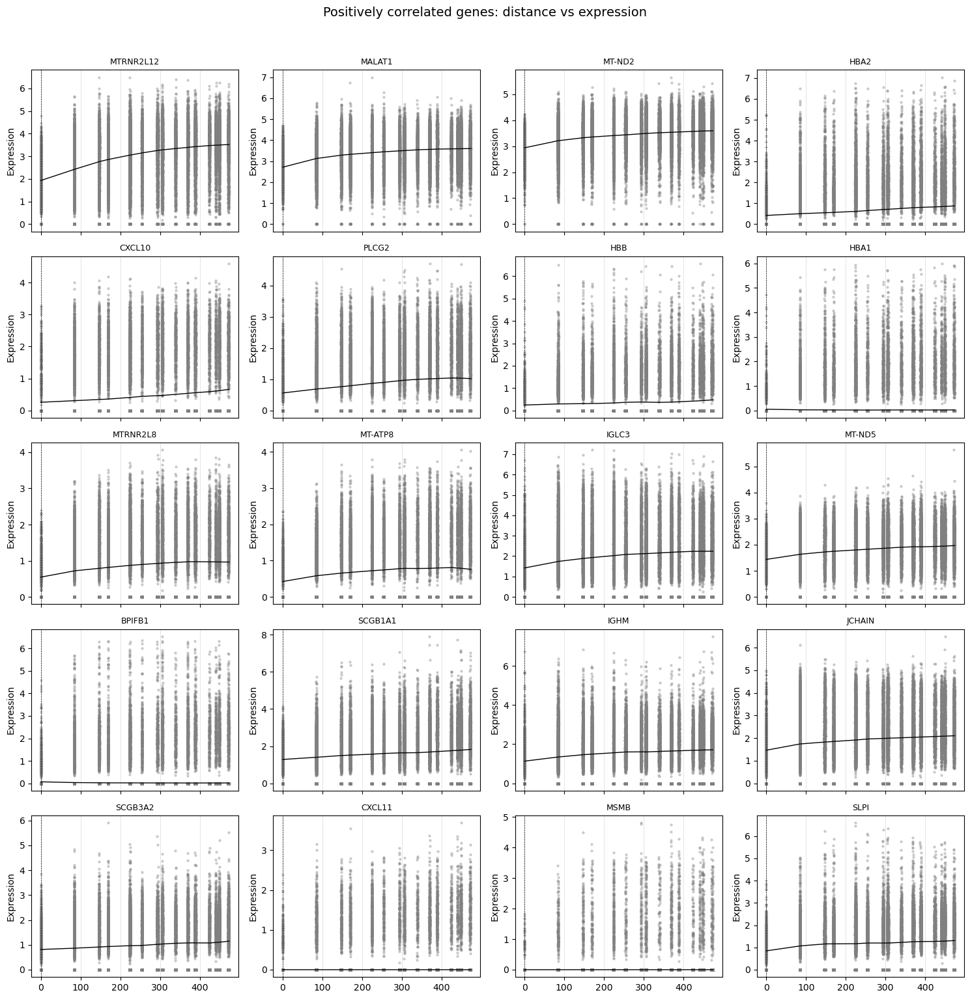

In [277]:
expr_df = pd.DataFrame(
    adata_sub[:, genes_pos].X.toarray(),
    index=adata_sub.obs_names,
    columns=genes_pos
).reset_index().melt(
    id_vars="index", value_vars=genes_pos,
    var_name="gene", value_name="expression"
)
expr_df["r_dist"] = adata_sub.obs.loc[expr_df["index"], "r_dist_myo_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)
ncols = 4
nrows = int(np.ceil(len(genes_pos)/ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 3*nrows), sharex=True)
axes = axes.flatten()

for i, gene in enumerate(genes_pos):
    df_g = expr_df.query("gene == @gene")
    x_smooth, y_smooth = smooth_curve(df_g["r_dist"], df_g["expression"], frac=0.3)
    axes[i].scatter(df_g["r_dist"], df_g["expression"], s=5, alpha=0.3, color="grey")
    axes[i].plot(x_smooth, y_smooth, color="black", lw=1)
    axes[i].axvline(0, ls="--", color="black", lw=0.5)
    axes[i].set_title(gene, fontsize=9)
    axes[i].set_ylabel("Expression")
    axes[i].grid(axis="x", color="grey", alpha=0.3, lw=0.5)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle("Positively correlated genes: distance vs expression", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

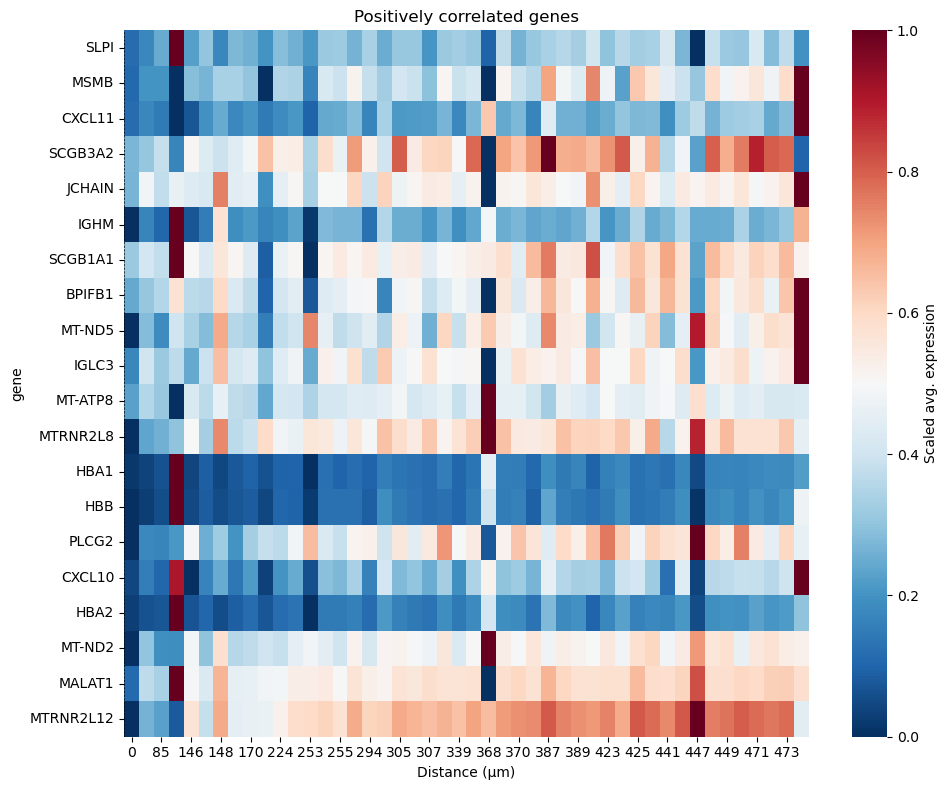

In [280]:
# long-format으로 변환: (spot, gene, expression, distance)
expr_df = pd.DataFrame(
    adata_sub[:, genes_pos].X.toarray(),
    index=adata_sub.obs_names,
    columns=genes_pos
).reset_index().melt(
    id_vars="index", value_vars=genes_pos,
    var_name="gene", value_name="expression"
)

expr_df["r_dist"] = adata_sub.obs.loc[expr_df["index"], "r_dist_myo_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)


avg_expr = (
    expr_df.groupby(["gene", "r_dist"])["expression"]
           .mean()
           .reset_index()
)

# 유전자별로 0–1 scaling
avg_expr["avg_expr_scaled"] = avg_expr.groupby("gene")["expression"].transform(
    lambda x: minmax_scale(x, feature_range=(0,1))
)
heatmap_data = avg_expr.pivot(index="gene", columns="r_dist", values="avg_expr_scaled")

# 유전자 순서를 correlation 높은 순서로 맞춤
heatmap_data = heatmap_data.reindex(index=genes_pos[::-1])

plt.figure(figsize=(10,8))
sns.heatmap(
    heatmap_data,
    cmap="RdBu_r",  # col_scale_lajolla 비슷한 팔레트
    cbar_kws={"label": "Scaled avg. expression"}
)
plt.axvline(x=np.where(heatmap_data.columns==0)[0][0], color="black", ls="--", lw=0.5)  # distance=0 선
plt.xlabel("Distance (µm)")
plt.title("Positively correlated genes")
plt.tight_layout()
plt.show()

/tmp/ipykernel_1236025/2809484819.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=pos_cor, y="gene", x="cor", palette="RdBu")


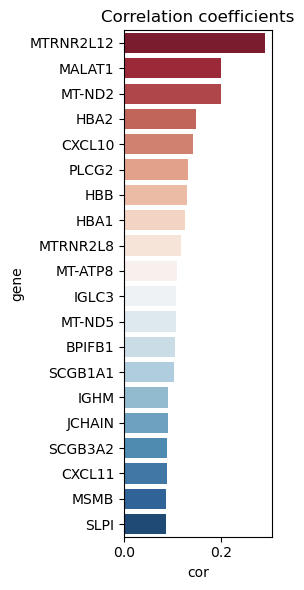

In [281]:
pos_cor = df_cor[df_cor["gene"].isin(genes_pos)].sort_values("cor", ascending=False)

plt.figure(figsize=(3,6))
sns.barplot(data=pos_cor, y="gene", x="cor", palette="RdBu")
plt.axvline(0, color="black", lw=0.5)
plt.title("Correlation coefficients")
plt.tight_layout()
plt.show()

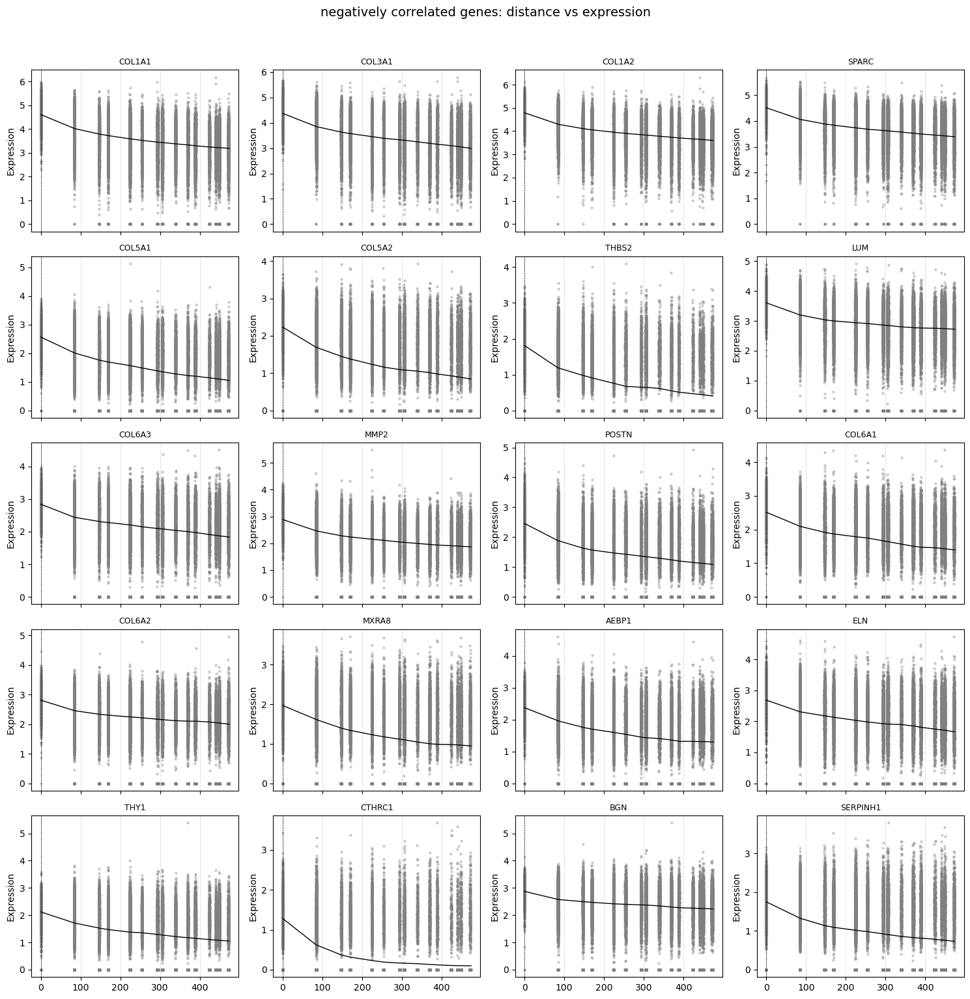

In [282]:
expr_df = pd.DataFrame(
    adata_sub[:, genes_neg].X.toarray(),
    index=adata_sub.obs_names,
    columns=genes_neg
).reset_index().melt(
    id_vars="index", value_vars=genes_neg,
    var_name="gene", value_name="expression"
)
expr_df["r_dist"] = adata_sub.obs.loc[expr_df["index"], "r_dist_myo_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)
ncols = 4
nrows = int(np.ceil(len(genes_neg)/ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 3*nrows), sharex=True)
axes = axes.flatten()

for i, gene in enumerate(genes_neg):
    df_g = expr_df.query("gene == @gene")
    x_smooth, y_smooth = smooth_curve(df_g["r_dist"], df_g["expression"], frac=0.3)
    axes[i].scatter(df_g["r_dist"], df_g["expression"], s=5, alpha=0.3, color="grey")
    axes[i].plot(x_smooth, y_smooth, color="black", lw=1)
    axes[i].axvline(0, ls="--", color="black", lw=0.5)
    axes[i].set_title(gene, fontsize=9)
    axes[i].set_ylabel("Expression")
    axes[i].grid(axis="x", color="grey", alpha=0.3, lw=0.5)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle("negatively correlated genes: distance vs expression", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

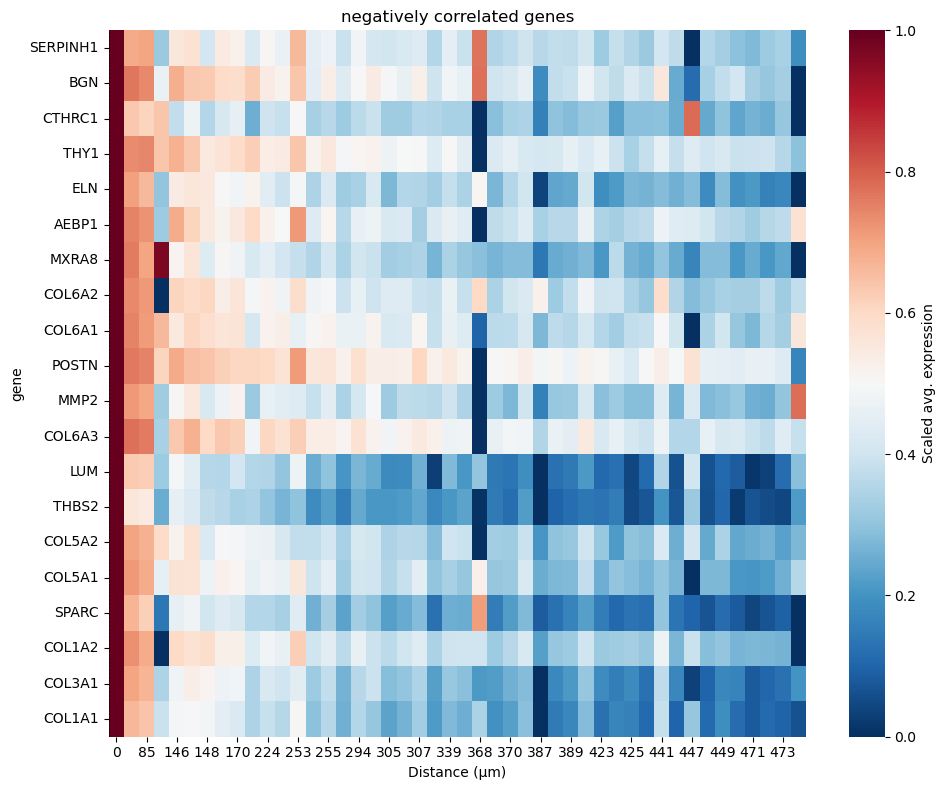

In [283]:
# long-format으로 변환: (spot, gene, expression, distance)
expr_df = pd.DataFrame(
    adata_sub[:, genes_neg].X.toarray(),
    index=adata_sub.obs_names,
    columns=genes_neg
).reset_index().melt(
    id_vars="index", value_vars=genes_neg,
    var_name="gene", value_name="expression"
)

expr_df["r_dist"] = adata_sub.obs.loc[expr_df["index"], "r_dist_myo_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)


avg_expr = (
    expr_df.groupby(["gene", "r_dist"])["expression"]
           .mean()
           .reset_index()
)

# 유전자별로 0–1 scaling
avg_expr["avg_expr_scaled"] = avg_expr.groupby("gene")["expression"].transform(
    lambda x: minmax_scale(x, feature_range=(0,1))
)
heatmap_data = avg_expr.pivot(index="gene", columns="r_dist", values="avg_expr_scaled")

# 유전자 순서를 correlation 높은 순서로 맞춤
heatmap_data = heatmap_data.reindex(index=genes_neg[::-1])

plt.figure(figsize=(10,8))
sns.heatmap(
    heatmap_data,
    cmap="RdBu_r",  # col_scale_lajolla 비슷한 팔레트
    cbar_kws={"label": "Scaled avg. expression"}
)
plt.axvline(x=np.where(heatmap_data.columns==0)[0][0], color="black", ls="--", lw=0.5)  # distance=0 선
plt.xlabel("Distance (µm)")
plt.title("negatively correlated genes")
plt.tight_layout()
plt.show()

/tmp/ipykernel_1236025/3033422190.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=neg_cor, y="gene", x="cor", palette="RdBu_r")


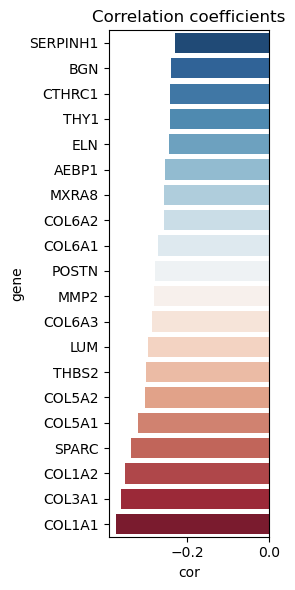

In [288]:
neg_cor = df_cor[df_cor["gene"].isin(genes_neg)].sort_values("cor", ascending=False)

plt.figure(figsize=(3,6))
sns.barplot(data=neg_cor, y="gene", x="cor", palette="RdBu_r")
plt.axvline(0, color="black", lw=0.5)
plt.title("Correlation coefficients")
plt.tight_layout()
plt.show()

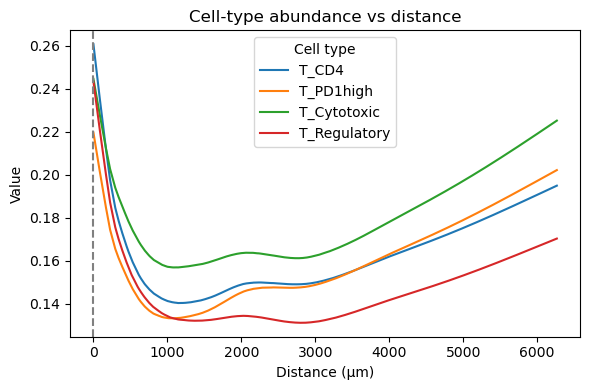

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess

features = ["T_CD4", "T_PD1high", "T_Cytotoxic", "T_Regulatory"]  # 예시
x = adata_merged.obs["r_dist_myo_um"].values

plt.figure(figsize=(6,4))

for f in features:
    y = adata_merged.obs[f].values
    smoothed = lowess(y, x, frac=0.3, return_sorted=True)  # LOESS smoothing
    plt.plot(smoothed[:,0], smoothed[:,1], label=f, lw=1.5)

plt.axvline(0, ls="--", color="grey")
plt.xlabel("Distance (µm)")
plt.ylabel("Value")
plt.title("Cell-type abundance vs distance")
plt.legend(title="Cell type")
plt.tight_layout()
plt.show()

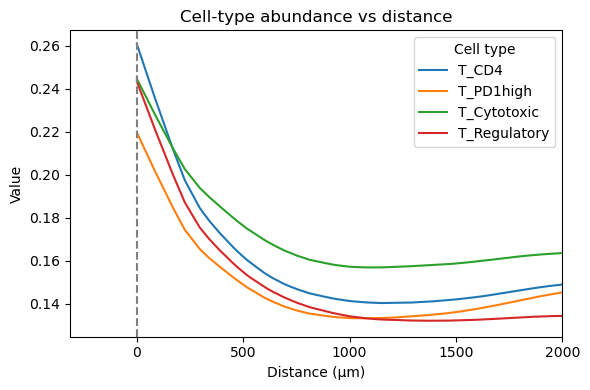

In [25]:
plt.figure(figsize=(6,4))

for f in features:
    y = adata_merged.obs[f].values
    smoothed = lowess(y, x, frac=0.3, return_sorted=True)
    plt.plot(smoothed[:,0], smoothed[:,1], label=f, lw=1.5)

plt.axvline(0, ls="--", color="grey")
plt.xlabel("Distance (µm)")
plt.ylabel("Value")
plt.title("Cell-type abundance vs distance")
plt.legend(title="Cell type")
plt.xlim(right=2000)   # 👈 최대값만 2000으로 설정, 최소값은 자동
plt.tight_layout()
plt.show()

In [26]:
adata_merged

AnnData object with n_obs × n_vars = 72674 × 13949
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'ATI', 'ATII', 'Aberrant_Basaloid', 'B', 'B_Plasma', 'Basal', 'Ciliated', 'Club', 'DC_Langerhans', 'DC_Mature', 'Fibroblast', 'Goblet', 'ILC_A', 'ILC_B', 'Ionocyte', 'Lymphatic', 'Macrophage', 'Macrophage_Alveolar', 'Mast', 'Mesothelial', 'Myofibroblast', 'NK', 'PNEC', 'Pericyte', 'SMC', 'T_CD4', 'T_Cytotoxic', 'T_PD1high', 'T_Regulatory', 'VE_Arterial', 'VE_Capillary_A', 'VE_Capillary_B', 'VE_Peribronchial', 'VE_Venous', 'cDC1', 'cDC2', 'cMonocyte', 'ncMonocyte', 'pDC', 'annotation', 'sample_batch', 'myo_top', 'fibro_top', 'r_dist_myo', 'r_dist_myo_um'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

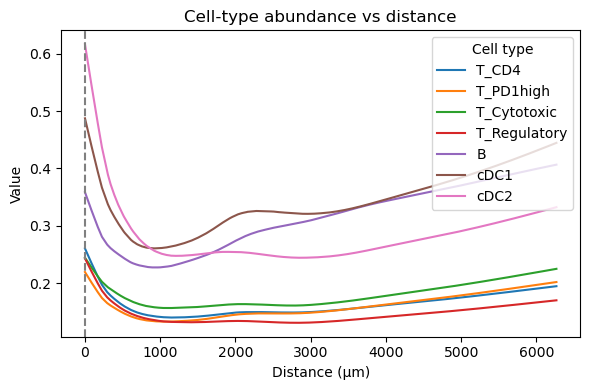

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess

features = ["T_CD4", "T_PD1high", "T_Cytotoxic", "T_Regulatory","B","cDC1","cDC2"]  # 예시
x = adata_merged.obs["r_dist_myo_um"].values

plt.figure(figsize=(6,4))

for f in features:
    y = adata_merged.obs[f].values
    smoothed = lowess(y, x, frac=0.3, return_sorted=True)  # LOESS smoothing
    plt.plot(smoothed[:,0], smoothed[:,1], label=f, lw=1.5)

plt.axvline(0, ls="--", color="grey")
plt.xlabel("Distance (µm)")
plt.ylabel("Value")
plt.title("Cell-type abundance vs distance")
plt.legend(title="Cell type")
plt.tight_layout()
plt.show()

# Distance analysis from Fibroblast

In [311]:
adata_merged=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/analysis/Radial_distance.h5ad")
adata_merged

AnnData object with n_obs × n_vars = 101907 × 13949
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'ATI', 'ATII', 'Aberrant_Basaloid', 'B', 'B_Plasma', 'Basal', 'Ciliated', 'Club', 'DC_Langerhans', 'DC_Mature', 'Fibroblast', 'Goblet', 'ILC_A', 'ILC_B', 'Ionocyte', 'Lymphatic', 'Macrophage', 'Macrophage_Alveolar', 'Mast', 'Mesothelial', 'Myofibroblast', 'NK', 'PNEC', 'Pericyte', 'SMC', 'T_CD4', 'T_Cytotoxic', 'T_PD1high', 'T_Regulatory', 'VE_Arterial', 'VE_Capillary_A', 'VE_Capillary_B', 'VE_Peribronchial', 'VE_Venous', 'cDC1', 'cDC2', 'cMonocyte', 'ncMonocyte', 'pDC', 'annotation', 'r_dist_FF', 'r_dist_FF_um', 'sample_batch', 'myo_top', 'fibro_top', 'pd1_top', 'nonpd1_top', 'treg_top'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [ ]:
adata_merged=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/analysis/Radial_distance.h5ad")
adata_merged
scores = adata_merged.obs["Fibroblast"]
cutoff = np.percentile(scores, 99)

plt.figure(figsize=(2,5))
sns.boxplot(y=scores, color="skyblue", width=0.2)
sns.stripplot(y=scores, color="grey", size=2, alpha=0.1)  # optional: 점도 같이 표시
plt.axhline(cutoff, color="red", ls="--", lw=1.2, label=f"99th percentile = {cutoff:.2f}")

plt.ylabel("Fibroblast score")
plt.title("Spot activity")
plt.legend()
plt.tight_layout()
plt.show()

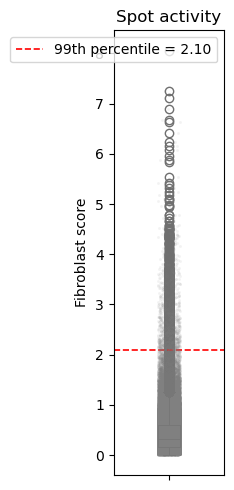

In [313]:
scores = adata_merged.obs["Fibroblast"]
cutoff = np.percentile(scores, 99)

plt.figure(figsize=(2,5))
sns.boxplot(y=scores, color="skyblue", width=0.2)
sns.stripplot(y=scores, color="grey", size=2, alpha=0.1)  # optional: 점도 같이 표시
plt.axhline(cutoff, color="red", ls="--", lw=1.2, label=f"99th percentile = {cutoff:.2f}")

plt.ylabel("Fibroblast score")
plt.title("Spot activity")
plt.legend()
plt.tight_layout()
plt.show()

In [312]:
pd.crosstab(adata_merged.obs["sample_batch"], adata_merged.obs["fibro_top"])

fibro_top,0,1
sample_batch,,
092A1,4185,14
092B1,4113,8
092C1,4535,27
092D1,3976,10
015A1,3643,0
015B1,3987,144
015C1,4653,87
015D1,3232,8
019A1,4393,0


In [314]:
split_adatas = {
    sample: adata_merged[adata_merged.obs["sample_batch"] == sample].copy()
    for sample in samples
}

samples = ["092A1","092B1","092C1","092D1", "015B1","015C1", "015D1","051B1","051C1",
           "051D1","279C1","279D1","280A1","280B1","280C1","280D1","281B1","281C1", "281D1","282B1"]

processed_adatas = []

for sample in samples:
    adata = split_adatas[sample].copy()
    scalef = scalef_dict[sample]
    
    coords = adata.obsm["spatial"]
    
    # Histology 영역 필터링
    mask_fibro = adata.obs["fibro_top"] == 1
    coords_fibro = coords[mask_fibro] 

    dist_matrix = cdist(coords, coords_fibro, metric="euclidean")
    min_dist = dist_matrix.min(axis=1)

    adata.obs["r_dist_fibro"] = min_dist
    adata.obs["r_dist_fibro_um"] = min_dist * scalef
    
    # sample 이름 저장
    adata.obs["sample"] = sample
    
    processed_adatas.append(adata)

adata_fibro = processed_adatas[0].concatenate(
    *processed_adatas[1:],
    batch_key="sample_batch",
    batch_categories=samples
)
adata_fibro

/tmp/ipykernel_1236025/3501655018.py:32: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_fibro = processed_adatas[0].concatenate(


AnnData object with n_obs × n_vars = 81280 × 13949
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'ATI', 'ATII', 'Aberrant_Basaloid', 'B', 'B_Plasma', 'Basal', 'Ciliated', 'Club', 'DC_Langerhans', 'DC_Mature', 'Fibroblast', 'Goblet', 'ILC_A', 'ILC_B', 'Ionocyte', 'Lymphatic', 'Macrophage', 'Macrophage_Alveolar', 'Mast', 'Mesothelial', 'Myofibroblast', 'NK', 'PNEC', 'Pericyte', 'SMC', 'T_CD4', 'T_Cytotoxic', 'T_PD1high', 'T_Regulatory', 'VE_Arterial', 'VE_Capillary_A', 'VE_Capillary_B', 'VE_Peribronchial', 'VE_Venous', 'cDC1', 'cDC2', 'cMonocyte', 'ncMonocyte', 'pDC', 'annotation', 'r_dist_FF', 'r_dist_FF_um', 'sample_batch', 'myo_top', 'fibro_top', 'pd1_top', 'nonpd1_top', 'treg_top', 'r_dist_fibro', 'r_dist_fibro_um'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

/home/jaehyunchoi/.conda/envs/spatial/lib/python3.10/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


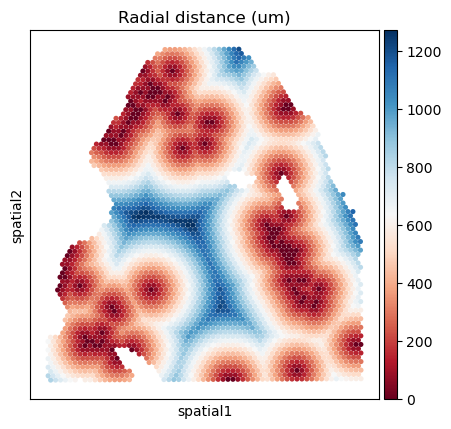

In [316]:
sc.pl.spatial(
    adata_fibro[adata_fibro.obs['sample_batch']=='281C1'],
    color=["r_dist_fibro_um"],
    img_key='hires',
    spot_size=30,
    size=5,
    title = "Radial distance (um)",
    cmap = "RdBu"
)

In [317]:
dist_cutoff = 500
adata_sub = adata_fibro[adata_fibro.obs["r_dist_fibro_um"] < dist_cutoff].copy()

sc.pp.normalize_total(adata_sub, target_sum=1e4)
sc.pp.log1p(adata_sub)

sc.pp.highly_variable_genes(adata_sub, n_top_genes=1000, flavor="seurat_v3")

sel_genes = adata_sub.var[adata_sub.var["highly_variable"]].index

/home/jaehyunchoi/.conda/envs/spatial/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:75: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


In [319]:
results = []
for g in sel_genes:
    y = adata_sub[:, g].X.toarray().flatten()
    x = adata_sub.obs["r_dist_fibro_um"].values
    if np.var(y) > 0:
        r, p = pearsonr(x, y)
        results.append([g, r, p])

df_cor = pd.DataFrame(results, columns=["gene", "cor", "pval"])
# FDR 보정
from statsmodels.stats.multitest import multipletests
df_cor["padj"] = multipletests(df_cor["pval"], method="fdr_bh")[1]
df_cor.sort_values("padj", ascending=True)

genes_pos = (
    df_cor.sort_values("cor", ascending=False)
          .query("padj < 0.05")              # sign_001 == TRUE 에 해당
          .head(n_genes)["gene"].tolist()
)
genes_neg = (
    df_cor.sort_values("cor", ascending=True)
          .query("pval < 0.05")
          .head(n_genes)["gene"].tolist()
)
df_cor[df_cor["gene"].isin(["PDCD1", "AREG", "IL1RL1","LGALS1"])]

,gene,cor,pval,padj
475,IL1RL1,0.028785,6.377405e-06,2.362002e-05
521,LGALS1,-0.067379,3.893009e-26,2.883710e-25


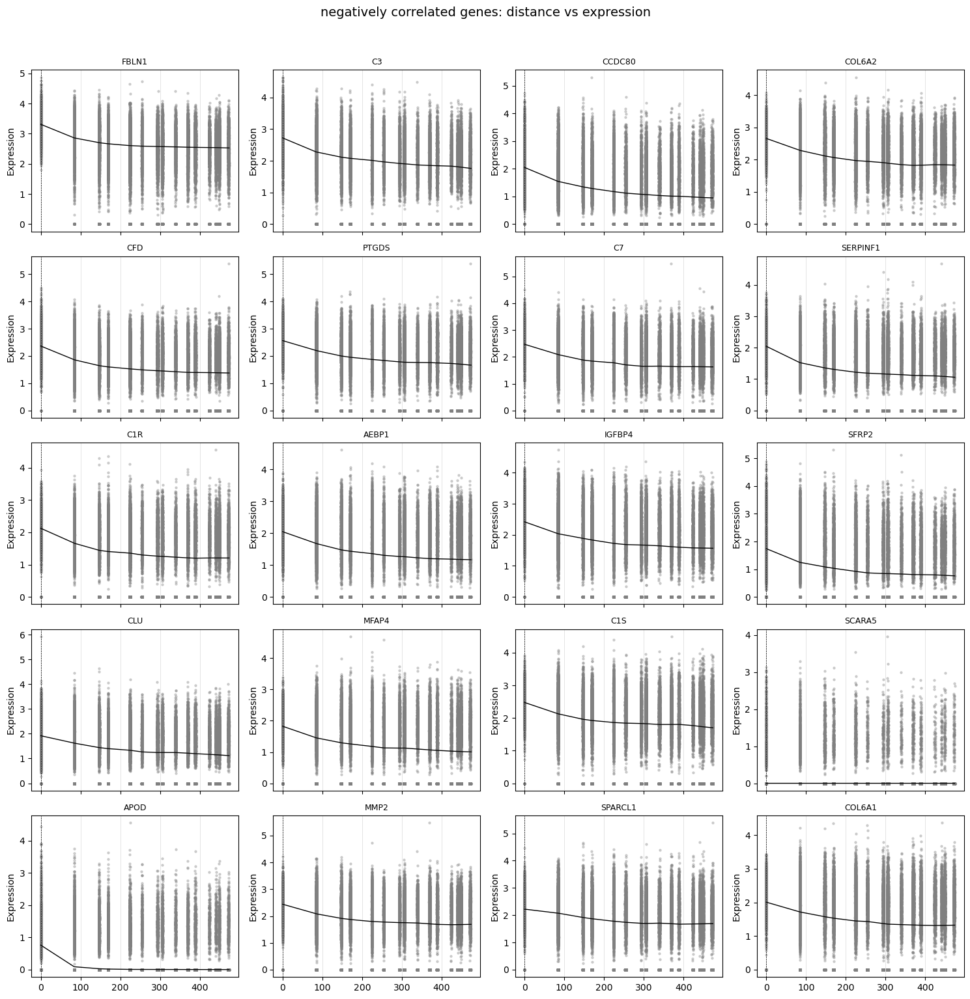

In [321]:
expr_df = pd.DataFrame(
    adata_sub[:, genes_neg].X.toarray(),
    index=adata_sub.obs_names,
    columns=genes_neg
).reset_index().melt(
    id_vars="index", value_vars=genes_neg,
    var_name="gene", value_name="expression"
)
expr_df["r_dist"] = adata_sub.obs.loc[expr_df["index"], "r_dist_fibro_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)
ncols = 4
nrows = int(np.ceil(len(genes_neg)/ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 3*nrows), sharex=True)
axes = axes.flatten()

for i, gene in enumerate(genes_neg):
    df_g = expr_df.query("gene == @gene")
    x_smooth, y_smooth = smooth_curve(df_g["r_dist"], df_g["expression"], frac=0.3)
    axes[i].scatter(df_g["r_dist"], df_g["expression"], s=5, alpha=0.3, color="grey")
    axes[i].plot(x_smooth, y_smooth, color="black", lw=1)
    axes[i].axvline(0, ls="--", color="black", lw=0.5)
    axes[i].set_title(gene, fontsize=9)
    axes[i].set_ylabel("Expression")
    axes[i].grid(axis="x", color="grey", alpha=0.3, lw=0.5)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle("negatively correlated genes: distance vs expression", y=1.02, fontsize=14)
plt.tight_layout()
plt.show()

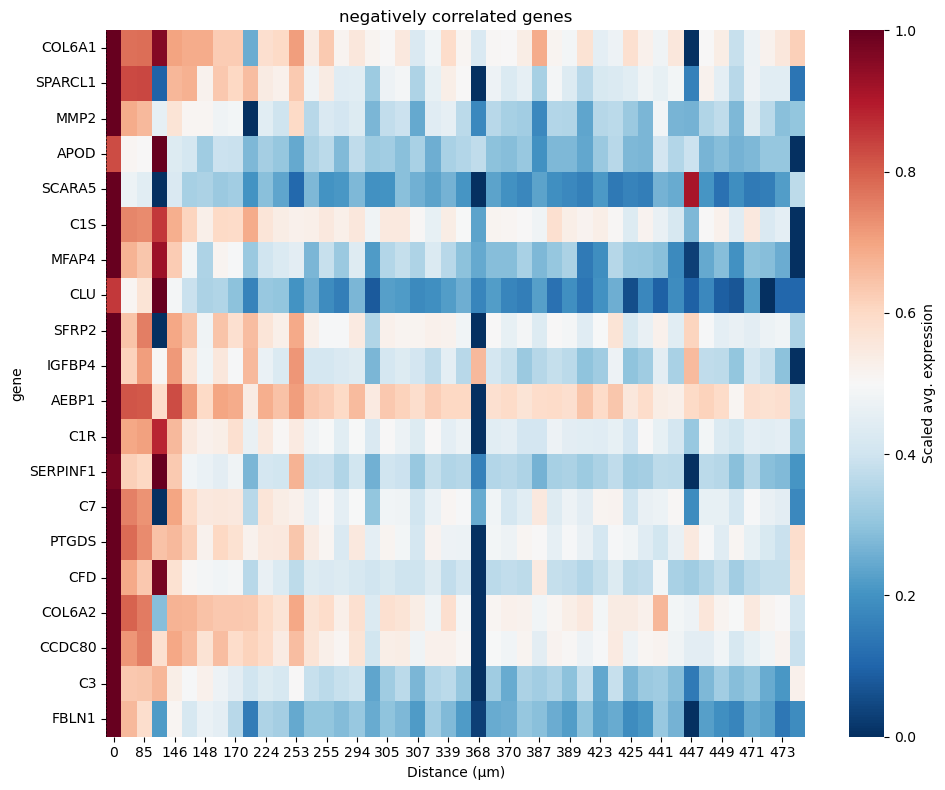

In [322]:
# long-format으로 변환: (spot, gene, expression, distance)
expr_df = pd.DataFrame(
    adata_sub[:, genes_neg].X.toarray(),
    index=adata_sub.obs_names,
    columns=genes_neg
).reset_index().melt(
    id_vars="index", value_vars=genes_neg,
    var_name="gene", value_name="expression"
)

expr_df["r_dist"] = adata_sub.obs.loc[expr_df["index"], "r_dist_fibro_um"].values
expr_df["r_dist"] = expr_df["r_dist"].round().astype(int)


avg_expr = (
    expr_df.groupby(["gene", "r_dist"])["expression"]
           .mean()
           .reset_index()
)

# 유전자별로 0–1 scaling
avg_expr["avg_expr_scaled"] = avg_expr.groupby("gene")["expression"].transform(
    lambda x: minmax_scale(x, feature_range=(0,1))
)
heatmap_data = avg_expr.pivot(index="gene", columns="r_dist", values="avg_expr_scaled")

# 유전자 순서를 correlation 높은 순서로 맞춤
heatmap_data = heatmap_data.reindex(index=genes_neg[::-1])

plt.figure(figsize=(10,8))
sns.heatmap(
    heatmap_data,
    cmap="RdBu_r",  # col_scale_lajolla 비슷한 팔레트
    cbar_kws={"label": "Scaled avg. expression"}
)
plt.axvline(x=np.where(heatmap_data.columns==0)[0][0], color="black", ls="--", lw=0.5)  # distance=0 선
plt.xlabel("Distance (µm)")
plt.title("negatively correlated genes")
plt.tight_layout()
plt.show()

/tmp/ipykernel_1236025/3033422190.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=neg_cor, y="gene", x="cor", palette="RdBu_r")


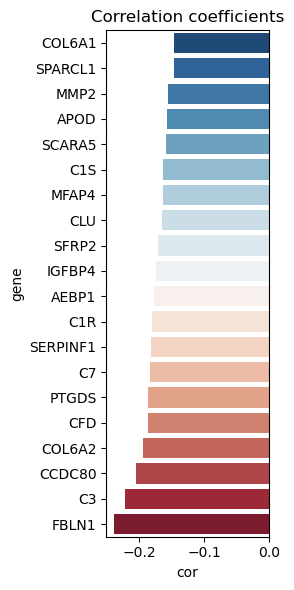

In [323]:
neg_cor = df_cor[df_cor["gene"].isin(genes_neg)].sort_values("cor", ascending=False)

plt.figure(figsize=(3,6))
sns.barplot(data=neg_cor, y="gene", x="cor", palette="RdBu_r")
plt.axvline(0, color="black", lw=0.5)
plt.title("Correlation coefficients")
plt.tight_layout()
plt.show()

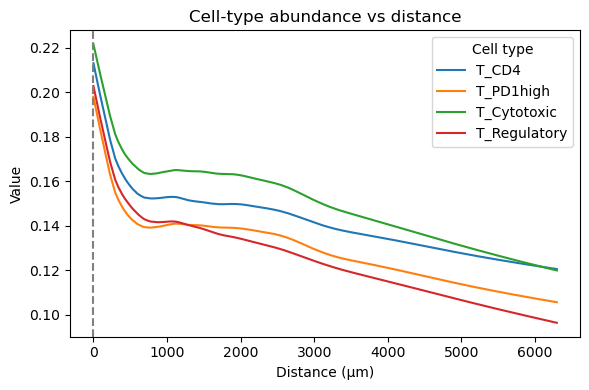

In [324]:
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess

features = ["T_CD4", "T_PD1high", "T_Cytotoxic", "T_Regulatory"]  # 예시
x = adata_fibro.obs["r_dist_fibro_um"].values

plt.figure(figsize=(6,4))

for f in features:
    y = adata_fibro.obs[f].values
    smoothed = lowess(y, x, frac=0.3, return_sorted=True)  # LOESS smoothing
    plt.plot(smoothed[:,0], smoothed[:,1], label=f, lw=1.5)

plt.axvline(0, ls="--", color="grey")
plt.xlabel("Distance (µm)")
plt.ylabel("Value")
plt.title("Cell-type abundance vs distance")
plt.legend(title="Cell type")
plt.tight_layout()
plt.show()

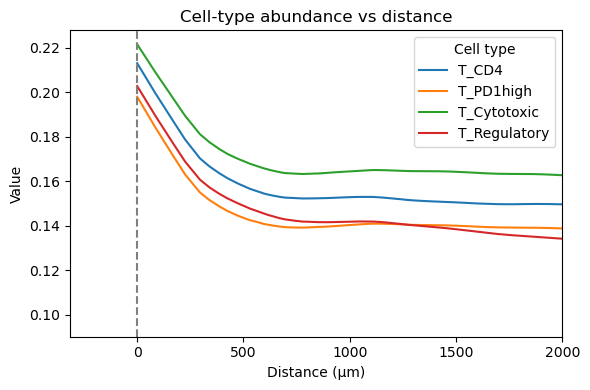

In [327]:
plt.figure(figsize=(6,4))

for f in features:
    y = adata_fibro.obs[f].values
    smoothed = lowess(y, x, frac=0.3, return_sorted=True)
    plt.plot(smoothed[:,0], smoothed[:,1], label=f, lw=1.5)

plt.axvline(0, ls="--", color="grey")
plt.xlabel("Distance (µm)")
plt.ylabel("Value")
plt.title("Cell-type abundance vs distance")
plt.legend(title="Cell type")
plt.xlim(right=2000)   # 👈 최대값만 2000으로 설정, 최소값은 자동
plt.tight_layout()
plt.show()

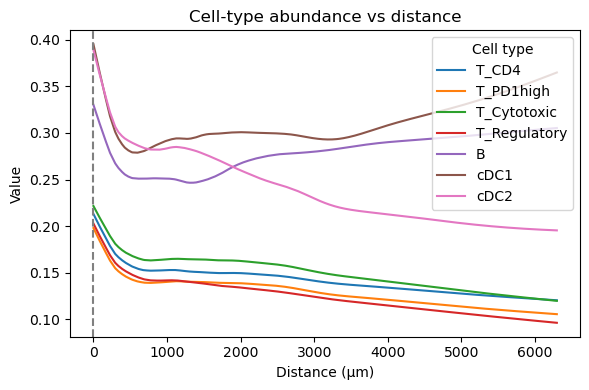

In [328]:
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess

features = ["T_CD4", "T_PD1high", "T_Cytotoxic", "T_Regulatory", "B", "cDC1", "cDC2"]  # 예시
x = adata_fibro.obs["r_dist_fibro_um"].values

plt.figure(figsize=(6,4))

for f in features:
    y = adata_fibro.obs[f].values
    smoothed = lowess(y, x, frac=0.3, return_sorted=True)  # LOESS smoothing
    plt.plot(smoothed[:,0], smoothed[:,1], label=f, lw=1.5)

plt.axvline(0, ls="--", color="grey")
plt.xlabel("Distance (µm)")
plt.ylabel("Value")
plt.title("Cell-type abundance vs distance")
plt.legend(title="Cell type")
plt.tight_layout()
plt.show()

In [325]:
adata_fibro

AnnData object with n_obs × n_vars = 81280 × 13949
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'ATI', 'ATII', 'Aberrant_Basaloid', 'B', 'B_Plasma', 'Basal', 'Ciliated', 'Club', 'DC_Langerhans', 'DC_Mature', 'Fibroblast', 'Goblet', 'ILC_A', 'ILC_B', 'Ionocyte', 'Lymphatic', 'Macrophage', 'Macrophage_Alveolar', 'Mast', 'Mesothelial', 'Myofibroblast', 'NK', 'PNEC', 'Pericyte', 'SMC', 'T_CD4', 'T_Cytotoxic', 'T_PD1high', 'T_Regulatory', 'VE_Arterial', 'VE_Capillary_A', 'VE_Capillary_B', 'VE_Peribronchial', 'VE_Venous', 'cDC1', 'cDC2', 'cMonocyte', 'ncMonocyte', 'pDC', 'annotation', 'r_dist_FF', 'r_dist_FF_um', 'sample_batch', 'myo_top', 'fibro_top', 'pd1_top', 'nonpd1_top', 'treg_top', 'r_dist_fibro', 'r_dist_fibro_um'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

# Distance from ILC

In [330]:
adata_merged=sc.read("/home/jaehyunchoi/bystander_collaboration/IPF_data/S-BSST1410/analysis/Radial_distance.h5ad")
adata_merged

AnnData object with n_obs × n_vars = 101907 × 13949
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels', 'ATI', 'ATII', 'Aberrant_Basaloid', 'B', 'B_Plasma', 'Basal', 'Ciliated', 'Club', 'DC_Langerhans', 'DC_Mature', 'Fibroblast', 'Goblet', 'ILC_A', 'ILC_B', 'Ionocyte', 'Lymphatic', 'Macrophage', 'Macrophage_Alveolar', 'Mast', 'Mesothelial', 'Myofibroblast', 'NK', 'PNEC', 'Pericyte', 'SMC', 'T_CD4', 'T_Cytotoxic', 'T_PD1high', 'T_Regulatory', 'VE_Arterial', 'VE_Capillary_A', 'VE_Capillary_B', 'VE_Peribronchial', 'VE_Venous', 'cDC1', 'cDC2', 'cMonocyte', 'ncMonocyte', 'pDC', 'annotation', 'r_dist_FF', 'r_dist_FF_um', 'sample_batch', 'myo_top', 'fibro_top', 'pd1_top', 'nonpd1_top', 'treg_top'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

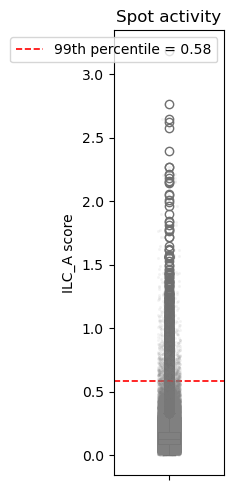

In [332]:
scores = adata_merged.obs["ILC_A"]
cutoff = np.percentile(scores, 99)

plt.figure(figsize=(2,5))
sns.boxplot(y=scores, color="skyblue", width=0.2)
sns.stripplot(y=scores, color="grey", size=2, alpha=0.1)  # optional: 점도 같이 표시
plt.axhline(cutoff, color="red", ls="--", lw=1.2, label=f"99th percentile = {cutoff:.2f}")

plt.ylabel("ILC_A score")
plt.title("Spot activity")
plt.legend()
plt.tight_layout()
plt.show()

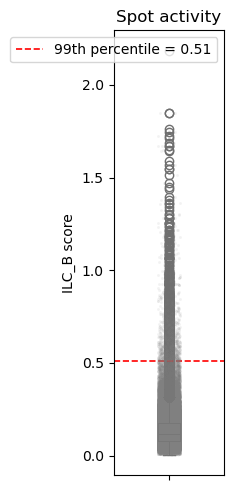

In [333]:
scores = adata_merged.obs["ILC_B"]
cutoff = np.percentile(scores, 99)

plt.figure(figsize=(2,5))
sns.boxplot(y=scores, color="skyblue", width=0.2)
sns.stripplot(y=scores, color="grey", size=2, alpha=0.1)  # optional: 점도 같이 표시
plt.axhline(cutoff, color="red", ls="--", lw=1.2, label=f"99th percentile = {cutoff:.2f}")

plt.ylabel("ILC_B score")
plt.title("Spot activity")
plt.legend()
plt.tight_layout()
plt.show()